In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import networkx as nx
import mlxtend as mx
from mlxtend.frequent_patterns import apriori, association_rules
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from xgboost import XGBClassifier, XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, f1_score, accuracy_score, precision_score, recall_score, classification_report, confusion_matrix, fbeta_score, roc_auc_score, roc_curve, precision_recall_curve, make_scorer
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold, GridSearchCV, RandomizedSearchCV, KFold
import optuna
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from sklearn.feature_selection import RFECV
from sklearn.multiclass import OneVsRestClassifier


In [2]:
path = "C:\\Users\\ssriv\\Warlord\\data mining individual\\dataset\\CDC Diabetes Dataset.csv"

In [3]:
df_import = pd.read_csv(path)

In [4]:
df_import.isna().sum()

Diabetes_012            0
HighBP                  0
HighChol                0
CholCheck               0
BMI                     0
Smoker                  0
Stroke                  0
HeartDiseaseorAttack    0
PhysActivity            0
Fruits                  0
Veggies                 0
HvyAlcoholConsump       0
AnyHealthcare           0
NoDocbcCost             0
GenHlth                 0
MentHlth                0
PhysHlth                0
DiffWalk                0
Sex                     0
Age                     0
Education               0
Income                  0
dtype: int64

In [5]:
df_import.duplicated().sum()

23899

In [6]:
df_import = df_import.drop_duplicates()

In [7]:
df_import.duplicated().sum()

0

In [ ]:
df_import = df_import.drop(columns=["DiffWalk"])

In [8]:
df_fe = df_import.copy()


In [9]:

df_fe["health_burden"] = (
    df_fe["HighBP"] +
    df_fe["HighChol"] +
    df_fe["HeartDiseaseorAttack"] +
    df_fe["Stroke"]
)


In [10]:
df_fe["lifestyle_risk"] = (
    df_fe["Smoker"] +
    (1 - df_fe["PhysActivity"]) +
    (1 - df_fe["Fruits"]) +
    (1 - df_fe["Veggies"]) +
    df_fe["HvyAlcoholConsump"]
)


In [11]:
df_fe["phys_mental_ratio"] = (
    df_fe["PhysHlth"] / (df_fe["MentHlth"] + 1)
)


In [13]:
df_fe["care_access"] = (
    df_fe["AnyHealthcare"] +
    df_fe["CholCheck"] -
    df_fe["NoDocbcCost"]
)


In [ ]:
df_fe[[
    "health_burden",
    "lifestyle_risk",
    "phys_mental_ratio",
    "care_access"
]].describe()


,health_burden,lifestyle_risk,phys_mental_ratio,bmi_diffwalk,care_access
count,229781.000000,229781.000000,229781.000000,229781.000000,229781.000000
mean,1.044172,1.385236,2.515669,5.803086,1.812800
std,0.976528,1.088040,6.535131,12.661519,0.469426
min,0.000000,0.000000,0.000000,0.000000,-1.000000
25%,0.000000,1.000000,0.000000,0.000000,2.000000
50%,1.000000,1.000000,0.000000,0.000000,2.000000
75%,2.000000,2.000000,1.153846,0.000000,2.000000
max,4.000000,5.000000,30.000000,98.000000,2.000000


In [15]:
df_fe.isna().sum()

Diabetes_012            0
HighBP                  0
HighChol                0
CholCheck               0
BMI                     0
Smoker                  0
Stroke                  0
HeartDiseaseorAttack    0
PhysActivity            0
Fruits                  0
Veggies                 0
HvyAlcoholConsump       0
AnyHealthcare           0
NoDocbcCost             0
GenHlth                 0
MentHlth                0
PhysHlth                0
DiffWalk                0
Sex                     0
Age                     0
Education               0
Income                  0
health_burden           0
lifestyle_risk          0
phys_mental_ratio       0
bmi_diffwalk            0
care_access             0
dtype: int64

In [17]:
df_fe.duplicated().sum()

0

In [ ]:
df_fe

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,DiffWalk,Sex,Age,Education,Income,health_burden,lifestyle_risk,phys_mental_ratio,bmi_diffwalk,care_access
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,9.0,4.0,3.0,2.0,3.0,0.789474,40.0,2.0
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,7.0,6.0,1.0,0.0,3.0,0.000000,0.0,-1.0
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,9.0,4.0,8.0,2.0,2.0,0.967742,28.0,1.0
3,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,11.0,3.0,6.0,1.0,0.0,0.000000,0.0,2.0
4,0.0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,11.0,5.0,4.0,2.0,0.0,0.000000,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253675,0.0,1.0,1.0,1.0,45.0,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,5.0,6.0,7.0,2.0,1.0,5.000000,0.0,2.0
253676,2.0,1.0,1.0,1.0,18.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,11.0,2.0,4.0,2.0,3.0,0.000000,18.0,2.0
253677,0.0,0.0,0.0,1.0,28.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,2.0,5.0,2.0,0.0,1.0,0.000000,0.0,2.0
253678,0.0,1.0,0.0,1.0,23.0,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,7.0,5.0,1.0,1.0,1.0,0.000000,0.0,2.0


# RFECV WITH ENGINEERED FEATURES

In [19]:
X = df_fe.drop(columns="Diabetes_012")

In [20]:
y = df_fe["Diabetes_012"]

In [21]:
X_train_smote, X_test_smote, y_train_smote, y_test_smote = train_test_split(
    X, y,
    test_size=0.2,
    stratify=y,
    random_state=42
)


In [72]:
y_train_smote.value_counts()

Diabetes_012
0.0    152043
2.0     28078
1.0      3703
Name: count, dtype: int64

In [22]:
from imblearn.under_sampling import RandomUnderSampler
from collections import Counter

counts = Counter(y_train_smote)

under_strategy = {
    0: int(counts[0] * 0.20),
    1: counts[1],   # keep all
    2: counts[2]    # keep all
}

undersampler = RandomUnderSampler(
    sampling_strategy=under_strategy,
    random_state=42
)

X_under, y_under = undersampler.fit_resample(X_train_smote, y_train_smote)

print("After undersampling:", Counter(y_under))


After undersampling: Counter({0.0: 30408, 2.0: 28078, 1.0: 3703})


In [51]:

counts_under = Counter(y_under)

smote_strategy = {
    1: int(counts_under[1] * 7.0),
    2: int(counts_under[2] * 1.05)  
}

smote = SMOTE(
    sampling_strategy=smote_strategy,
    k_neighbors=min(5, counts_under[1] - 1),
    random_state=42
)

X_train_res, y_train_res = smote.fit_resample(X_under, y_under)

print("Final distribution:", Counter(y_train_res))


Final distribution: Counter({0.0: 30408, 2.0: 29481, 1.0: 25921})


In [52]:
f2_scorer = make_scorer(fbeta_score, beta=2, average='macro')

# 5-fold CV
cv = KFold(n_splits=5, shuffle=True, random_state=42)

pipe = Pipeline([
    ("rfecv", RFECV(
        estimator=RandomForestClassifier(
            n_estimators=1000,
            class_weight={
                0: 1.0,
                1: 3.0,
                2: 1.0
            },
            random_state=42,
            n_jobs=-1
        ),
        step=1,
        cv=cv,
        scoring=f2_scorer, 
        n_jobs=-1
    ))
])

# Fit
pipe.fit(X_train_res, y_train_res)

# Extract RFECV
rfecv = pipe.named_steps["rfecv"]

# Selected features
selected_features = X_train_res.columns[rfecv.support_]

# Feature importances
feature_importance = pd.DataFrame({
    "feature": selected_features,
    "importance": rfecv.estimator_.feature_importances_
}).sort_values("importance", ascending=False)

print(feature_importance)


                 feature  importance
2                    BMI    0.108639
16                   Age    0.093231
11               GenHlth    0.079076
18                Income    0.071252
19         health_burden    0.066485
17             Education    0.056417
15                   Sex    0.049062
1               HighChol    0.047518
0                 HighBP    0.047201
20        lifestyle_risk    0.042024
21     phys_mental_ratio    0.038957
3                 Smoker    0.036923
12              MentHlth    0.036743
13              PhysHlth    0.035111
6           PhysActivity    0.032706
7                 Fruits    0.029553
22          bmi_diffwalk    0.026757
5   HeartDiseaseorAttack    0.026726
8                Veggies    0.023146
23           care_access    0.016044
10           NoDocbcCost    0.010840
4                 Stroke    0.009130
14              DiffWalk    0.008766
9      HvyAlcoholConsump    0.007691


In [53]:
feature_cols = [c for c in X_train_res.columns]

In [54]:
feature_cols

['HighBP',
 'HighChol',
 'CholCheck',
 'BMI',
 'Smoker',
 'Stroke',
 'HeartDiseaseorAttack',
 'PhysActivity',
 'Fruits',
 'Veggies',
 'HvyAlcoholConsump',
 'AnyHealthcare',
 'NoDocbcCost',
 'GenHlth',
 'MentHlth',
 'PhysHlth',
 'DiffWalk',
 'Sex',
 'Age',
 'Education',
 'Income',
 'health_burden',
 'lifestyle_risk',
 'phys_mental_ratio',
 'bmi_diffwalk',
 'care_access']

In [55]:
rfecv.fit(X_train_res, y_train_res)
 
print(" RFECV COMPLETE! \n")

print(f"\nOptimal number of features: {rfecv.n_features_}")
print(f"Features removed: {len(feature_cols) - rfecv.n_features_}")
print(f"\nBest cross-validation score (f2-score): {rfecv.cv_results_['mean_test_score'].max():.4f}")

 RFECV COMPLETE! 


Optimal number of features: 24
Features removed: 2

Best cross-validation score (f2-score): 0.7581


In [56]:
# Get selected features
selected_features = [f for f, selected in zip(feature_cols, rfecv.support_) if selected]
removed_features = [f for f, selected in zip(feature_cols, rfecv.support_) if not selected]
 
print("Selected Features")
print("=" * 60)
print(f"Total selected: {len(selected_features)}\n")
for i, feat in enumerate(selected_features, 1):
    print(f"{i:2d}. {feat}")
 
print("\n" + "=" * 60)
print("Removed Features")
print("=" * 60)
print(f"Total removed: {len(removed_features)}\n")
for i, feat in enumerate(removed_features, 1):
    print(f"{i:2d}. {feat}")

Selected Features
Total selected: 24

 1. HighBP
 2. HighChol
 3. BMI
 4. Smoker
 5. Stroke
 6. HeartDiseaseorAttack
 7. PhysActivity
 8. Fruits
 9. Veggies
10. HvyAlcoholConsump
11. NoDocbcCost
12. GenHlth
13. MentHlth
14. PhysHlth
15. DiffWalk
16. Sex
17. Age
18. Education
19. Income
20. health_burden
21. lifestyle_risk
22. phys_mental_ratio
23. bmi_diffwalk
24. care_access

Removed Features
Total removed: 2

 1. CholCheck
 2. AnyHealthcare


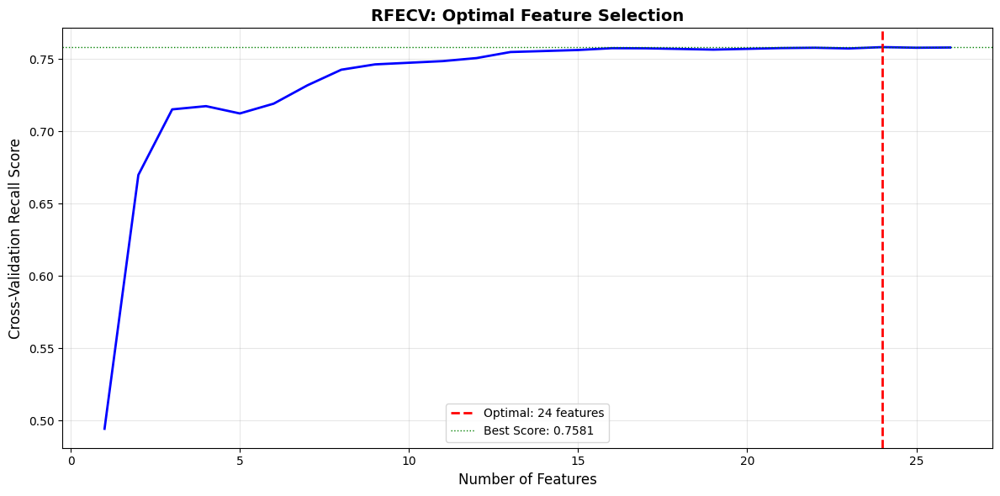

 Optimal features identified: 24


In [57]:
# Plot: Number of features vs Cross-validation score
plt.figure(figsize=(12, 6))
 
# Get scores for each number of features
n_features_range = range(1, len(rfecv.cv_results_['mean_test_score']) + 1)
scores = rfecv.cv_results_['mean_test_score']
 
plt.plot(n_features_range, scores, linewidth=2, color='blue')
plt.axvline(x=rfecv.n_features_, color='red', linestyle='--',
            label=f'Optimal: {rfecv.n_features_} features', linewidth=2)
plt.axhline(y=scores.max(), color='green', linestyle=':',
            label=f'Best Score: {scores.max():.4f}', linewidth=1)
 
plt.xlabel('Number of Features', fontsize=12)
plt.ylabel('Cross-Validation Recall Score', fontsize=12)
plt.title('RFECV: Optimal Feature Selection', fontsize=14, fontweight='bold')
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()
 
print(f" Optimal features identified: {rfecv.n_features_}")

In [ ]:
feature_importance["features"].drop(columns="DiffWalk")

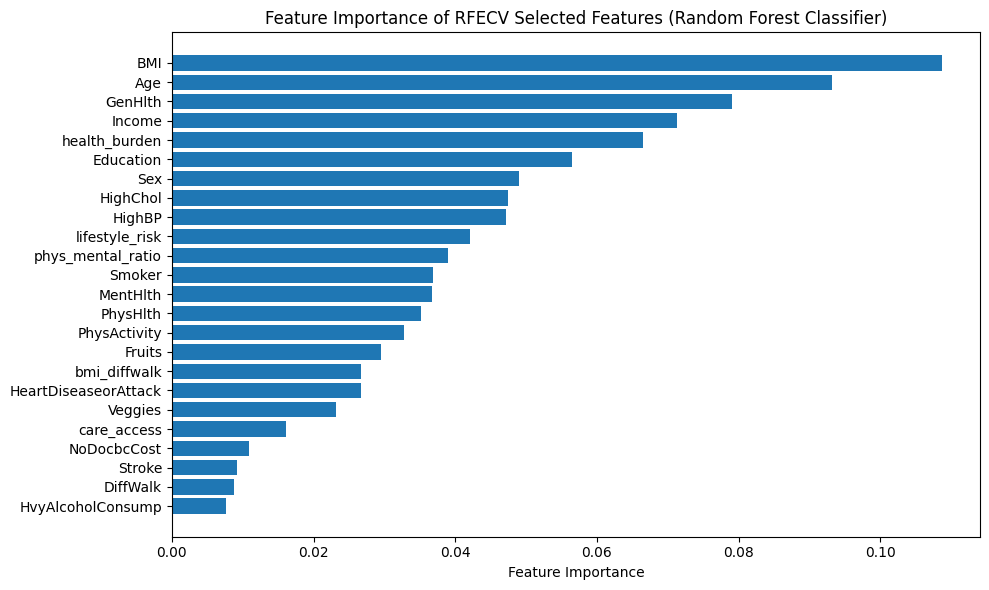

In [58]:

plt.figure(figsize=(10, 6))
plt.barh(
    feature_importance["feature"],
    feature_importance["importance"]
)
plt.gca().invert_yaxis()  # Most important at top
plt.xlabel("Feature Importance")
plt.title("Feature Importance of RFECV Selected Features (Random Forest Classifier)")
plt.tight_layout()
plt.show()


In [59]:
feature_importance["feature"]

2                      BMI
16                     Age
11                 GenHlth
18                  Income
19           health_burden
17               Education
15                     Sex
1                 HighChol
0                   HighBP
20          lifestyle_risk
21       phys_mental_ratio
3                   Smoker
12                MentHlth
13                PhysHlth
6             PhysActivity
7                   Fruits
22            bmi_diffwalk
5     HeartDiseaseorAttack
8                  Veggies
23             care_access
10             NoDocbcCost
4                   Stroke
14                DiffWalk
9        HvyAlcoholConsump
Name: feature, dtype: object

In [60]:
features_to_use = feature_importance["feature"]
X_train_model = X_train_res[features_to_use]

In [61]:
X_train_model

,BMI,Age,GenHlth,Income,health_burden,Education,Sex,HighChol,HighBP,lifestyle_risk,...,PhysActivity,Fruits,bmi_diffwalk,HeartDiseaseorAttack,Veggies,care_access,NoDocbcCost,Stroke,DiffWalk,HvyAlcoholConsump
0,35.000000,4.000000,3.000000,7.000000,1.000000,6.000000,1.000000,1.000000,0.000000,1.000000,...,1.000000,0.000000,0.0000,0.000000,1.0,2.000000,0.000000,0.0,0.0,0.0
1,29.000000,8.000000,2.000000,8.000000,1.000000,5.000000,1.000000,0.000000,1.000000,3.000000,...,0.000000,0.000000,0.0000,0.000000,1.0,2.000000,0.000000,0.0,0.0,0.0
2,27.000000,10.000000,3.000000,8.000000,0.000000,6.000000,0.000000,0.000000,0.000000,1.000000,...,1.000000,1.000000,0.0000,0.000000,1.0,2.000000,0.000000,0.0,0.0,0.0
3,35.000000,9.000000,3.000000,8.000000,0.000000,5.000000,1.000000,0.000000,0.000000,1.000000,...,1.000000,1.000000,0.0000,0.000000,1.0,2.000000,0.000000,0.0,0.0,0.0
4,20.000000,6.000000,1.000000,8.000000,0.000000,6.000000,0.000000,0.000000,0.000000,1.000000,...,1.000000,0.000000,0.0000,0.000000,1.0,1.000000,0.000000,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85805,38.736200,7.736200,4.000000,2.736200,1.000000,4.000000,0.736200,0.000000,0.263800,0.736200,...,1.000000,1.000000,38.7362,0.736200,1.0,2.000000,0.000000,0.0,1.0,0.0
85806,24.669757,9.000000,3.000000,6.000000,2.669757,3.330243,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,0.0000,0.669757,1.0,2.000000,0.000000,0.0,0.0,0.0
85807,32.000000,10.000000,3.000000,7.000000,1.000000,6.000000,0.000000,0.906066,0.093934,0.000000,...,1.000000,1.000000,0.0000,0.000000,1.0,2.000000,0.000000,0.0,0.0,0.0
85808,24.066701,2.800026,3.266675,3.266675,0.266675,3.266675,0.733325,0.266675,0.000000,1.266675,...,0.733325,0.266675,0.0000,0.000000,1.0,1.266675,0.733325,0.0,0.0,0.0


In [62]:
y_train_model = y_train_res

In [63]:
y_train_model

0        0.0
1        0.0
2        0.0
3        0.0
4        0.0
        ... 
85805    2.0
85806    2.0
85807    2.0
85808    2.0
85809    2.0
Name: Diabetes_012, Length: 85810, dtype: float64

In [64]:
# Define scorer globally so it's not recreated every trial
f2_macro_scorer1 = make_scorer(fbeta_score, beta=2, average='macro')

def objective_rf_multiclass1(trial):
    # --- TUNABLE CLASS WEIGHTS ---
    # Tuning weights helps balance the trade-off between classes
    w1 = trial.suggest_float("weight_class_1", 3.0, 8.0)  # Diabetic
    w2 = trial.suggest_float("weight_class_2", 1.5, 3.0)  # Pre-diabetic

    rf_params = {
        "n_estimators": trial.suggest_int("n_estimators", 300, 1000),
        "max_depth": trial.suggest_int("max_depth", 6, 25),
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 15),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 8),
        "max_features": trial.suggest_categorical("max_features", ["sqrt", "log2"]),
        
        # Native Multiclass Weighting
        "class_weight": {
            0: 1.0,     # Baseline
            1: w1,      # Diabetic (High priority)
            2: w2       # Pre-diabetic
        },
        "random_state": 42,
        
        # Disable inner parallelism to avoid conflict with cross_val_score
        "n_jobs": 1 
    }

    # Initialize Native RF (No OneVsOne Wrapper needed)
    model_rf = RandomForestClassifier(**rf_params)

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    scores = cross_val_score(
        model_rf,
        X_train_model,
        y_train_model,
        cv=cv,
        scoring=f2_macro_scorer1,
        
        # Use parallelism ONLY here (outer loop)
        n_jobs=-1  
    )

    return scores.mean()

# --- OPTUNA STUDY ---
study_rf1 = optuna.create_study(
    direction="maximize",
    study_name="RF_Native_MacroF2_Optimization"
)

study_rf1.optimize(
    objective_rf_multiclass1, 
    n_trials=100, 
    show_progress_bar=True
)

print("Best Macro F2:", study_rf1.best_value)
print("Best params:", study_rf1.best_params)

[I 2026-02-06 22:01:40,199] A new study created in memory with name: RF_Native_MacroF2_Optimization


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-06 22:02:41,998] Trial 0 finished with value: 0.7151617260931965 and parameters: {'weight_class_1': 6.423883955276482, 'weight_class_2': 2.821941027303755, 'n_estimators': 804, 'max_depth': 17, 'min_samples_split': 14, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7151617260931965.
[I 2026-02-06 22:03:25,080] Trial 1 finished with value: 0.7493988833513742 and parameters: {'weight_class_1': 3.217679078591633, 'weight_class_2': 2.614489056317793, 'n_estimators': 513, 'max_depth': 24, 'min_samples_split': 11, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.7493988833513742.
[I 2026-02-06 22:03:39,912] Trial 2 finished with value: 0.5779482494547408 and parameters: {'weight_class_1': 4.478843418174698, 'weight_class_2': 2.7698692464048973, 'n_estimators': 357, 'max_depth': 6, 'min_samples_split': 13, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 1 with value: 0.7493988833513742.
[I 2026-02-06 22:04:12

In [65]:
best_params_rf1 = study_rf1.best_params.copy()

w1 = best_params_rf1.pop("weight_class_1")
w2 = best_params_rf1.pop("weight_class_2")

best_rf_1 = RandomForestClassifier(
    **best_params_rf1,
    class_weight={
        0: 1.0,
        1: w1,
        2: w2
    },
    random_state=42,
    n_jobs=-1
)

best_rf_1.fit(X_train_model, y_train_model)


,n_estimators,990
,criterion,'gini'
,max_depth,25
,min_samples_split,5
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [66]:
X_test_model = X_test_smote[features_to_use]

In [67]:
y_test_model = y_test_smote

In [73]:
y_pred_rf_1 = best_rf_1.predict(X_test_model)
y_proba_rf_1      = best_rf_1.predict_proba(X_test_model)
acc_rf_1 = accuracy_score(y_test_model, y_pred_rf_1)
pre_rf_1 = precision_score(y_test_model, y_pred_rf_1, average='macro')
rec_rf_1 = recall_score(y_test_model, y_pred_rf_1, average='macro')
f1_rf_1  = f1_score(y_test_model, y_pred_rf_1, average='macro')
f2_rf_1  = fbeta_score(y_test_model, y_pred_rf_1, beta=2, average='macro')
roc_rf_1 = roc_auc_score(
    y_test_model,
    y_proba_rf_1,
    multi_class='ovr',
    average='macro'
)
print(f"Accuracy  : {acc_rf_1:.4f}")
print(f"Precision : {pre_rf_1:.4f}")
print(f"Recall    : {rec_rf_1:.4f}")
print(f"F1 Score  : {f1_rf_1:.4f}")
print(f"F2 Score  : {f2_rf_1:.4f}")
print(f"ROC AUC   : {roc_rf_1:.4f}")

Accuracy  : 0.6620
Precision : 0.4220
Recall    : 0.4904
F1 Score  : 0.4041
F2 Score  : 0.4341
ROC AUC   : 0.7389


In [69]:
def apply_thresholds(proba, t1=0.12, t2=0.35):
    y_pred = []

    for p0, p1, p2 in proba:
        if p1 >= t1:
            y_pred.append(1)
        elif p2 >= t2:
            y_pred.append(2)
        else:
            y_pred.append(0)

    return np.array(y_pred)


In [70]:
y_pred_thresh_1 = apply_thresholds(
    y_proba_rf_1,
    t1=0.12,
    t2=0.35
)
print(confusion_matrix(y_test_model, y_pred_thresh_1))
print("Macro Recall:", recall_score(y_test_model, y_pred_thresh_1, average="macro"))
print("Macro F2    :", fbeta_score(y_test_model, y_pred_thresh_1, beta=2, average="macro"))


[[17178  9727 11107]
 [  132   364   430]
 [  498  2408  4113]]
Macro Recall: 0.4769931283531034
Macro F2    : 0.362767881122079


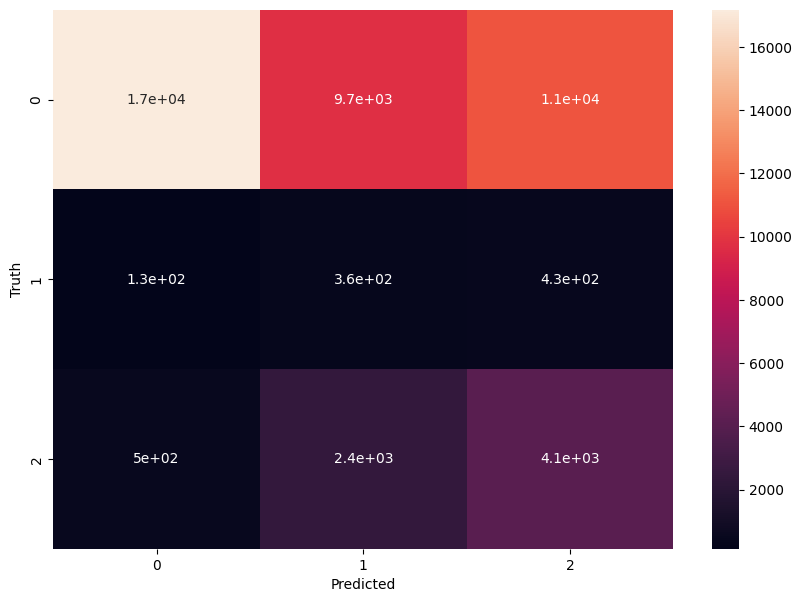

In [71]:
cm_1 = confusion_matrix(y_test_model, y_pred_thresh_1)
plt.figure(figsize=(10,7))
sns.heatmap(cm_1, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')
plt.show()

In [ ]:
from sklearn.model_selection import StratifiedShuffleSplit
# Number of SHAP samples
N_SHAP = 1000  # safe + fast

sss = StratifiedShuffleSplit(
    n_splits=1,
    train_size=N_SHAP,
    random_state=42
)

for idx, _ in sss.split(X_train_model, y_train_model):
    X_shap = X_train_model.iloc[idx]
    y_shap = y_train_model.iloc[idx]


In [ ]:
import shap

explainer = shap.TreeExplainer(best_rf_1)

shap_values = explainer.shap_values(X_shap)


In [ ]:
# Global scorer
f2_macro_scorer1 = make_scorer(fbeta_score, beta=2, average="macro")

def objective_rf_ovr_multiclass(trial):

    # Weight for POSITIVE class in each OvR binary task
    pos_weight = trial.suggest_float("pos_weight", 2.0, 8.0)

    rf_params = {
        "n_estimators": trial.suggest_int("n_estimators", 300, 1000),
        "max_depth": trial.suggest_int("max_depth", 6, 25),
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 15),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 8),
        "max_features": trial.suggest_categorical("max_features", ["sqrt", "log2"]),

        # Binary weighting (OvR-compatible)
        "class_weight": {
            0: 1.0,
            1: pos_weight
        },

        "random_state": 42,
        "n_jobs": 1  # Important: avoid nested parallelism
    }+

    base_rf = RandomForestClassifier(**rf_params)

    model = OneVsRestClassifier(
        base_rf,
        n_jobs=-1  # Parallelize OvR outer loop
    )

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    scores = cross_val_score(
        model,
        X_train_model,
        y_train_model,
        cv=cv,
        scoring=f2_macro_scorer1,
        n_jobs=-1
    )

    return scores.mean()


study_rf_ovr = optuna.create_study(
    direction="maximize",
    study_name="RF_OvR_MacroF2_Optimization"
)

study_rf_ovr.optimize(
    objective_rf_ovr_multiclass,
    n_trials=100,
    show_progress_bar=True
)

print("Best Macro F2:", study_rf_ovr.best_value)
print("Best params:", study_rf_ovr.best_params)


[I 2026-02-08 16:23:43,991] A new study created in memory with name: RF_OvR_MacroF2_Optimization


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-08 16:24:11,306] Trial 0 finished with value: 0.7514985828682701 and parameters: {'pos_weight': 7.431609165516216, 'n_estimators': 475, 'max_depth': 10, 'min_samples_split': 6, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.7514985828682701.
[I 2026-02-08 16:24:58,832] Trial 1 finished with value: 0.7571412457461688 and parameters: {'pos_weight': 7.308764822699135, 'n_estimators': 720, 'max_depth': 12, 'min_samples_split': 10, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 1 with value: 0.7571412457461688.
[I 2026-02-08 16:26:04,007] Trial 2 finished with value: 0.7628049209988468 and parameters: {'pos_weight': 5.151649118213427, 'n_estimators': 806, 'max_depth': 19, 'min_samples_split': 15, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.7628049209988468.
[I 2026-02-08 16:26:46,348] Trial 3 finished with value: 0.7228819435724327 and parameters: {'pos_weight': 2.564658564658069, 'n_estimators': 947,

In [75]:
best_params_rf_ovr = study_rf_ovr.best_params.copy()
pos_weight_ovr = best_params_rf_ovr.pop("pos_weight")

final_rf_ovr = RandomForestClassifier(
    **best_params_rf_ovr,
    class_weight={0: 1.0, 1: pos_weight_ovr},
    random_state=42,
    n_jobs=1
)

final_model_ovr = OneVsRestClassifier(
    final_rf_ovr,
    n_jobs=-1
)

final_model_ovr.fit(X_train_model, y_train_model)


,estimator,RandomForestC...ndom_state=42)
,n_jobs,-1
,verbose,0
,n_estimators,828
,criterion,'gini'
,max_depth,23
,min_samples_split,13
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,'log2'
,max_leaf_nodes,None


In [76]:
y_pred_rf_ovr = final_model_ovr.predict(X_test_model)
y_proba_rf_ovr = final_model_ovr.predict_proba(X_test_model)
acc_rf_ovr = accuracy_score(y_test_model, y_pred_rf_ovr)
pre_rf_ovr = precision_score(y_test_model, y_pred_rf_ovr, average='macro')
rec_rf_ovr = recall_score(y_test_model, y_pred_rf_ovr, average='macro')
f1_rf_ovr  = f1_score(y_test_model, y_pred_rf_ovr, average='macro')
f2_rf_ovr  = fbeta_score(y_test_model, y_pred_rf_ovr, beta=2, average='macro')
roc_rf_ovr = roc_auc_score(
    y_test_model,
    y_proba_rf_ovr,
    multi_class='ovr',
    average='macro'
)
print(f"Accuracy  : {acc_rf_ovr:.4f}")
print(f"Precision : {pre_rf_ovr:.4f}")
print(f"Recall    : {rec_rf_ovr:.4f}")
print(f"F1 Score  : {f1_rf_ovr:.4f}")
print(f"F2 Score  : {f2_rf_ovr:.4f}")
print(f"ROC AUC   : {roc_rf_ovr:.4f}")

Accuracy  : 0.7097
Precision : 0.4320
Recall    : 0.4951
F1 Score  : 0.4221
F2 Score  : 0.4513
ROC AUC   : 0.7437


In [77]:
y_pred_thresh_ovr = apply_thresholds(
    y_proba_rf_ovr,
    t1=0.12,
    t2=0.35
)
print(confusion_matrix(y_test_model, y_pred_thresh_ovr))
print("Macro Recall:", recall_score(y_test_model, y_pred_thresh_ovr, average="macro"))
print("Macro F2    :", fbeta_score(y_test_model, y_pred_thresh_ovr, beta=2, average="macro"))


[[13783 15555  8674]
 [   90   551   285]
 [  303  4017  2699]]
Macro Recall: 0.44738537673900775
Macro F2    : 0.28994994948476177


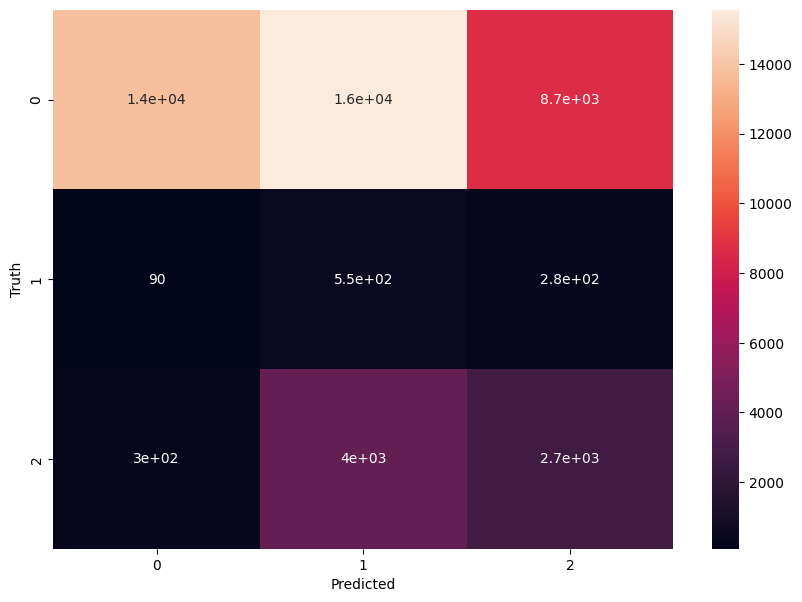

In [78]:
cm_ovr = confusion_matrix(y_test_model, y_pred_thresh_ovr)
plt.figure(figsize=(10,7))
sns.heatmap(cm_ovr, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')
plt.show()

In [ ]:
import shap

explainer = shap.TreeExplainer(final_model_ovr)

shap_values = explainer.shap_values(X_shap)


In [79]:
from sklearn.utils.class_weight import compute_sample_weight
def objective_xgb_multiclass(trial):

    # --- Tunable class weights ---
    w1 = trial.suggest_float("weight_class_1", 3.0, 8.0)  # diabetic
    w2 = trial.suggest_float("weight_class_2", 1.5, 3.0)  # pre-diabetic

    # Hyperparameters
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 300, 1000),
        "max_depth": trial.suggest_int("max_depth", 3, 30),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3, log=True),
        "subsample": trial.suggest_float("subsample", 0.6, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),
        "gamma": trial.suggest_float("gamma", 0.0, 5.0),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 10),
        "objective": "multi:softprob",
        "num_class": 3,
        "random_state": 42,
        "n_jobs": -1
    }

    # Prepare sample weights
    class_weights = {0: 1.0, 1: w1, 2: w2}
    sample_weights = compute_sample_weight(class_weights, y_train_model)

    # Stratified KFold
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    scores = []

    for train_idx, val_idx in cv.split(X_train_model, y_train_model):
        X_tr, X_val = X_train_model.iloc[train_idx], X_train_model.iloc[val_idx]
        y_tr, y_val = y_train_model.iloc[train_idx], y_train_model.iloc[val_idx]
        sw_tr = sample_weights[train_idx]

        model = XGBClassifier(**params)
        model.fit(X_tr, y_tr, sample_weight=sw_tr)
        y_pred = model.predict(X_val)

        score = fbeta_score(y_val, y_pred, beta=2, average='macro')
        scores.append(score)

    return np.mean(scores)


# --- Optuna study ---
study_xgb = optuna.create_study(
    direction="maximize",
    study_name="XGB_MacroF2_Multiclass"
)

study_xgb.optimize(
    objective_xgb_multiclass,
    n_trials=100,
    show_progress_bar=True
)

print("Best Macro F2:", study_xgb.best_value)
print("Best params:", study_xgb.best_params)


[I 2026-02-08 17:51:16,757] A new study created in memory with name: XGB_MacroF2_Multiclass


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-08 17:52:54,197] Trial 0 finished with value: 0.7515078612999199 and parameters: {'weight_class_1': 4.174969881083005, 'weight_class_2': 2.658622631289685, 'n_estimators': 731, 'max_depth': 29, 'learning_rate': 0.08947758281497971, 'subsample': 0.8858749794722074, 'colsample_bytree': 0.9715092397781309, 'gamma': 0.18281197794022874, 'min_child_weight': 5}. Best is trial 0 with value: 0.7515078612999199.
[I 2026-02-08 17:53:04,302] Trial 1 finished with value: 0.739909221947886 and parameters: {'weight_class_1': 5.220537086551346, 'weight_class_2': 2.375492086991644, 'n_estimators': 576, 'max_depth': 7, 'learning_rate': 0.07827587702363495, 'subsample': 0.8889386308065297, 'colsample_bytree': 0.7180878543443348, 'gamma': 3.3003952348517056, 'min_child_weight': 2}. Best is trial 0 with value: 0.7515078612999199.
[I 2026-02-08 17:53:26,788] Trial 2 finished with value: 0.7568539097043687 and parameters: {'weight_class_1': 4.770960823215214, 'weight_class_2': 1.6202758786710851,

In [80]:
best_params_xgb = study_xgb.best_params.copy()

# REMOVE Optuna-only params
w1 = best_params_xgb.pop("weight_class_1")
w2 = best_params_xgb.pop("weight_class_2")

# Compute sample weights
sample_weights = compute_sample_weight(
    {0: 1.0, 1: w1, 2: w2},
    y_train_model
)

# Train final model
best_xgb_class = XGBClassifier(
    **best_params_xgb,
    objective="multi:softprob",
    num_class=3,
    random_state=42,
    n_jobs=-1
)

best_xgb_class.fit(
    X_train_model,
    y_train_model,
    sample_weight=sample_weights
)


,objective,'multi:softprob'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,None
,colsample_bynode,None
,colsample_bytree,0.6441072518793463
,device,None
,early_stopping_rounds,None
,enable_categorical,False
,eval_metric,None


In [81]:
y_pred_xgb_class = best_xgb_class.predict(X_test_model)
y_proba_xgb      = best_xgb_class.predict_proba(X_test_model)
acc_xgb          = accuracy_score(y_test_model, y_pred_xgb_class)
pre_xgb          = precision_score(y_test_model, y_pred_xgb_class, average='macro')
rec_xgb          = recall_score(y_test_model, y_pred_xgb_class, average='macro')
f1_xgb           = f1_score(y_test_model, y_pred_xgb_class, average='macro')
f2_xgb           = fbeta_score(y_test_model, y_pred_xgb_class, beta=2, average='macro')
roc_xgb          = roc_auc_score(
    y_test_model,
    y_proba_xgb,
    multi_class='ovr',
    average='macro'
)
print(f"Accuracy  : {acc_xgb:.4f}")
print(f"Precision : {pre_xgb:.4f}")
print(f"Recall    : {rec_xgb:.4f}")
print(f"F1 Score  : {f1_xgb:.4f}")
print(f"F2 Score  : {f2_xgb:.4f}")
print(f"ROC AUC   : {roc_xgb:.4f}")

Accuracy  : 0.6429
Precision : 0.4281
Recall    : 0.4956
F1 Score  : 0.3968
F2 Score  : 0.4291
ROC AUC   : 0.7493


In [86]:
y_pred_thresh_xgb = apply_thresholds(
    y_proba_xgb,
    t1=0.18,
    t2=0.30
)
print(confusion_matrix(y_test_model, y_pred_thresh_xgb))
print("Macro Recall:", recall_score(y_test_model, y_pred_thresh_xgb, average="macro"))
print("Macro F2    :", fbeta_score(y_test_model, y_pred_thresh_xgb, beta=2, average="macro"))


[[16869  7503 13640]
 [  118   281   527]
 [  385  1618  5016]]
Macro Recall: 0.48728944958421655
Macro F2    : 0.37858032173628703


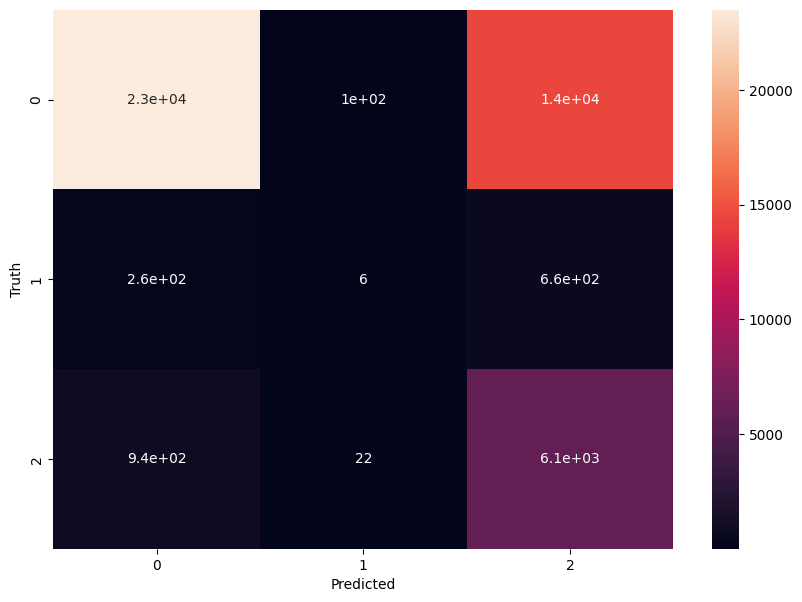

In [87]:
cm_xgb = confusion_matrix(y_test_model, y_pred_xgb_class)
plt.figure(figsize=(10,7))
sns.heatmap(cm_xgb, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')
plt.show()

In [ ]:
import shap

explainer = shap.TreeExplainer(best_xgb_class)

shap_values = explainer.shap_values(X_shap)


In [88]:
f2_macro_scorer = make_scorer(fbeta_score, beta=2, average="macro")
def objective_xgb_multiclass(trial):

    xgb_params = {
        "n_estimators": trial.suggest_int("n_estimators", 300, 1000),
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3, log=True),
        "subsample": trial.suggest_float("subsample", 0.6, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 10),
        "gamma": trial.suggest_float("gamma", 0, 5),
        "reg_alpha": trial.suggest_float("reg_alpha", 0, 5),
        "reg_lambda": trial.suggest_float("reg_lambda", 1, 10),

        # IMPORTANT
        "objective": "binary:logistic",  # OvR → binary per class
        "eval_metric": "logloss",
        "tree_method": "hist",
        "random_state": 42,
        "n_jobs": -1
    }

    base_xgb = XGBClassifier(**xgb_params)
    model = OneVsRestClassifier(base_xgb)

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    scores = cross_val_score(
        model,
        X_train_model,
        y_train_model,
        cv=cv,
        scoring=f2_macro_scorer,
        n_jobs=-1
    )

    return scores.mean()

study_xgb_ovr = optuna.create_study(
    direction="maximize",
    study_name="XGB_OvR_MacroF2"
)

study_xgb_ovr.optimize(
    objective_xgb_multiclass,
    n_trials=100,
    show_progress_bar=True
)

print("Best Macro F2:", study_xgb_ovr.best_value)
print("Best params:", study_xgb_ovr.best_params)



[I 2026-02-08 19:23:11,817] A new study created in memory with name: XGB_OvR_MacroF2


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-08 19:23:23,007] Trial 0 finished with value: 0.7626016789256125 and parameters: {'n_estimators': 610, 'max_depth': 5, 'learning_rate': 0.03050386051750727, 'subsample': 0.9343840963989463, 'colsample_bytree': 0.7071405361314158, 'min_child_weight': 2, 'gamma': 4.207486119678759, 'reg_alpha': 3.8520332823089043, 'reg_lambda': 7.437354470115837}. Best is trial 0 with value: 0.7626016789256125.
[I 2026-02-08 19:23:29,578] Trial 1 finished with value: 0.7651861646059887 and parameters: {'n_estimators': 323, 'max_depth': 9, 'learning_rate': 0.1555135029870678, 'subsample': 0.7771049032754986, 'colsample_bytree': 0.6486572288424701, 'min_child_weight': 10, 'gamma': 2.07479679194883, 'reg_alpha': 2.2844636257934963, 'reg_lambda': 8.944067371211581}. Best is trial 1 with value: 0.7651861646059887.
[I 2026-02-08 19:23:45,621] Trial 2 finished with value: 0.7663683781324939 and parameters: {'n_estimators': 806, 'max_depth': 6, 'learning_rate': 0.03776688813146921, 'subsample': 0.6334

In [89]:
# Best params from Optuna
best_params_xgb_ovr = study_xgb_ovr.best_params.copy()

# Build base binary XGBoost (OvR expects binary)
base_xgb_1 = XGBClassifier(
    **best_params_xgb_ovr,
    objective="binary:logistic",
    eval_metric="logloss",
    tree_method="hist",
    random_state=42,
    n_jobs=-1
)

# Wrap with One-vs-Rest
best_xgb_ovr = OneVsRestClassifier(
    base_xgb_1,
    n_jobs=-1
)

# Fit on full training data
best_xgb_ovr.fit(
    X_train_model,
    y_train_model
)


,estimator,"XGBClassifier...ree=None, ...)"
,n_jobs,-1
,verbose,0
,objective,'binary:logistic'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,None
,colsample_bynode,None
,colsample_bytree,0.8411573294163398
,device,None


In [90]:
y_pred_xgb_class_ovr = best_xgb_ovr.predict(X_test_model)
y_proba_xgb_ovr      = best_xgb_ovr.predict_proba(X_test_model)
acc_xgb_ovr          = accuracy_score(y_test_model, y_pred_xgb_class_ovr)
pre_xgb_ovr          = precision_score(y_test_model, y_pred_xgb_class_ovr, average='macro')
rec_xgb_ovr          = recall_score(y_test_model, y_pred_xgb_class_ovr, average='macro')
f1_xgb_ovr           = f1_score(y_test_model, y_pred_xgb_class_ovr, average='macro')
f2_xgb_ovr           = fbeta_score(y_test_model, y_pred_xgb_class_ovr, beta=2, average='macro')
roc_xgb_ovr          = roc_auc_score(
    y_test_model,
    y_proba_xgb_ovr,
    multi_class='ovr',
    average='macro'
)
print(f"Accuracy  : {acc_xgb_ovr:.4f}")
print(f"Precision : {pre_xgb_ovr:.4f}")
print(f"Recall    : {rec_xgb_ovr:.4f}")
print(f"F1 Score  : {f1_xgb_ovr:.4f}")
print(f"F2 Score  : {f2_xgb_ovr:.4f}")
print(f"ROC AUC   : {roc_xgb_ovr:.4f}")

Accuracy  : 0.7145
Precision : 0.4199
Recall    : 0.4976
F1 Score  : 0.4243
F2 Score  : 0.4541
ROC AUC   : 0.7471


In [91]:
y_pred_thresh_xgb_ovr = apply_thresholds(
    y_proba_xgb_ovr,
    t1=0.05,
    t2=0.40
)
print(confusion_matrix(y_test_model, y_pred_thresh_xgb_ovr))
print("Macro Recall:", recall_score(y_test_model, y_pred_thresh_xgb_ovr, average="macro"))
print("Macro F2    :", fbeta_score(y_test_model, y_pred_thresh_xgb_ovr, beta=2, average="macro"))


[[15013 19192  3807]
 [  119   624   183]
 [  419  4617  1983]]
Macro Recall: 0.4504463976757604
Macro F2    : 0.2833228450879611


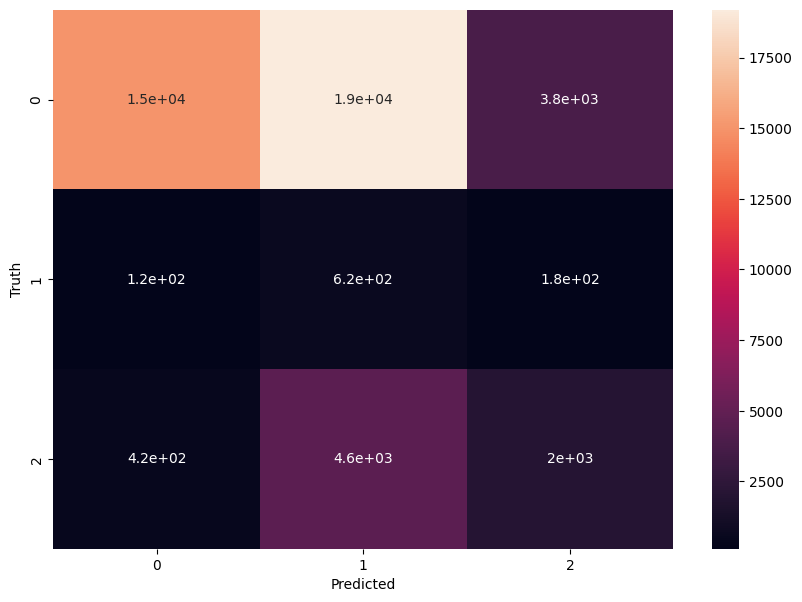

In [92]:
cm_xgb_ovr = confusion_matrix(y_test_model, y_pred_thresh_xgb_ovr)
plt.figure(figsize=(10,7))
sns.heatmap(cm_xgb_ovr, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')
plt.show()

In [ ]:
import shap

explainer = shap.TreeExplainer(best_xgb_ovr)

shap_values = explainer.shap_values(X_shap)


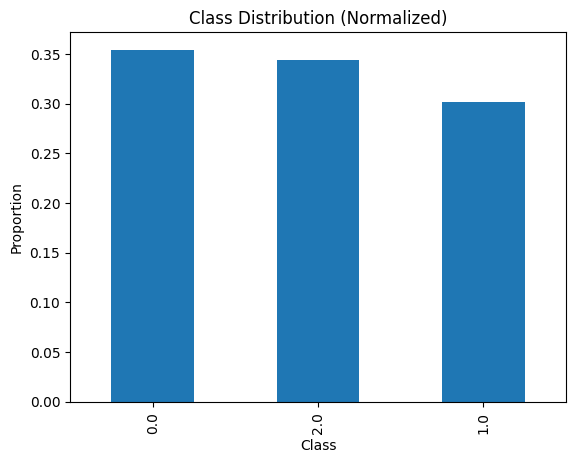

Diabetes_012
0.0    30408
2.0    29481
1.0    25921
Name: count, dtype: int64


In [93]:
y_train_model.value_counts(normalize=True).plot(kind='bar')
plt.title("Class Distribution (Normalized)")
plt.ylabel("Proportion")
plt.xlabel("Class")
plt.show()

print(y_train_model.value_counts())


In [ ]:
binary_features = [
    'HighBP', 'HighChol', 'Smoker', 'Stroke',
    'HeartDiseaseorAttack', 'AnyHealthcare',
    'CholCheck', 'DiffWalk'
]

ordinal_features = [
    'GenHlth', 'Age', 'Education', 'Income'
]

continuous_features = [
    'BMI', 'PhysHlth', 'MentHlth'
]


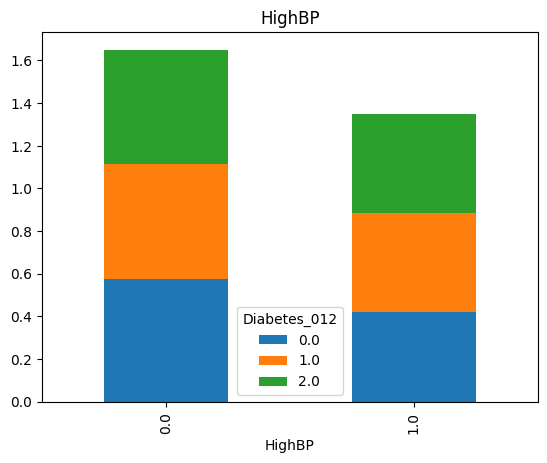

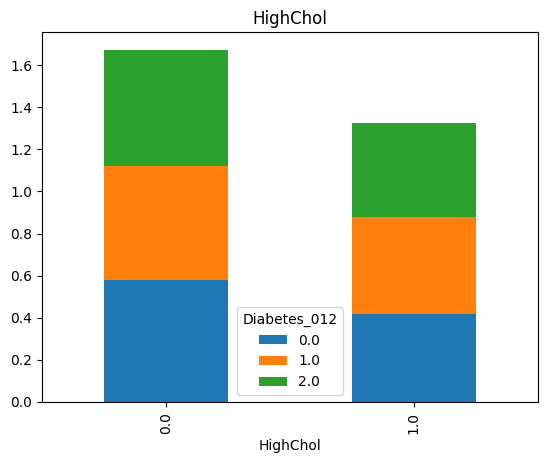

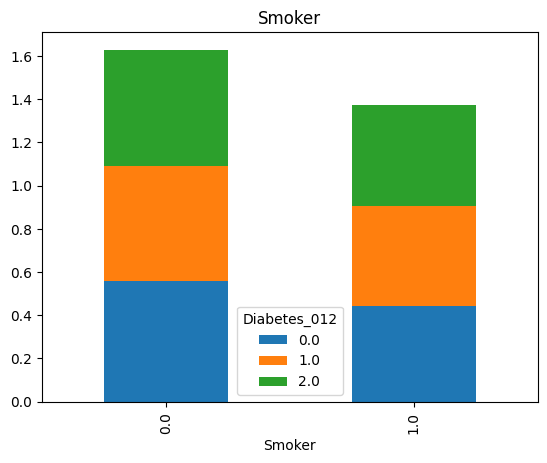

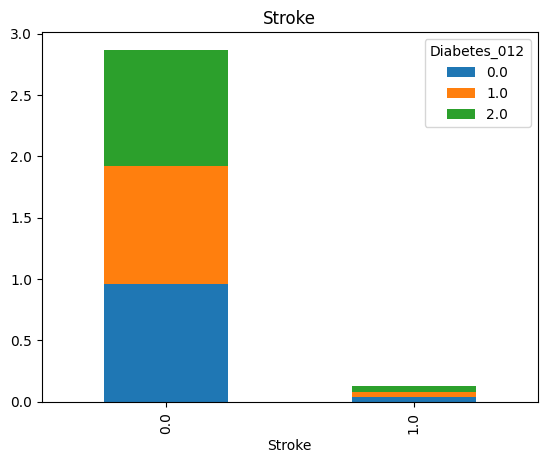

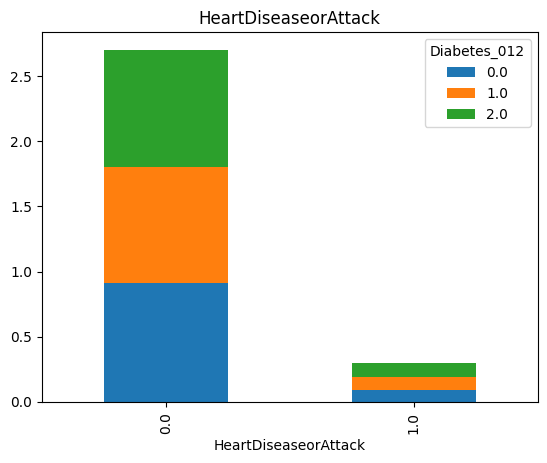

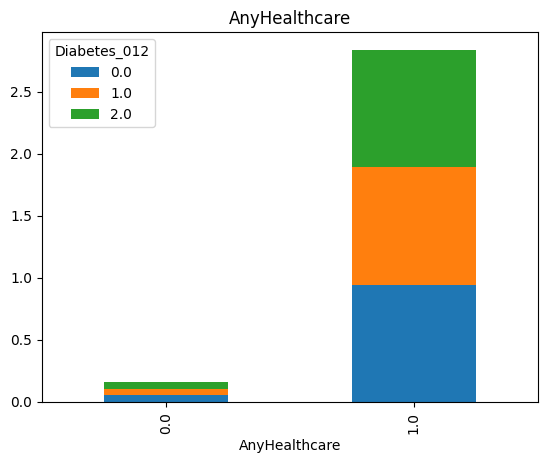

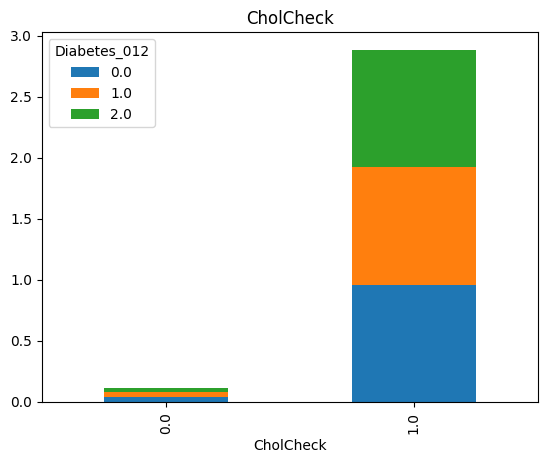

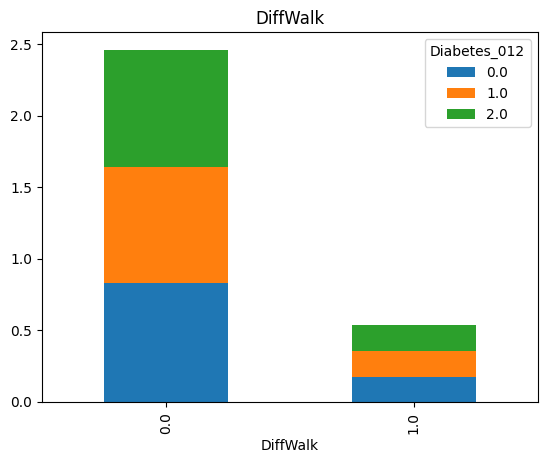

In [96]:

for col in binary_features:
    ct = pd.crosstab(df_fe[col], y_train_model, normalize='columns')
    ct.plot(kind='bar', stacked=True, title=col)
    plt.show()


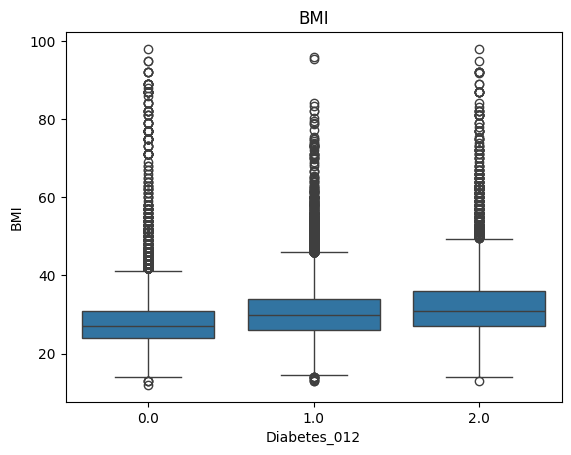

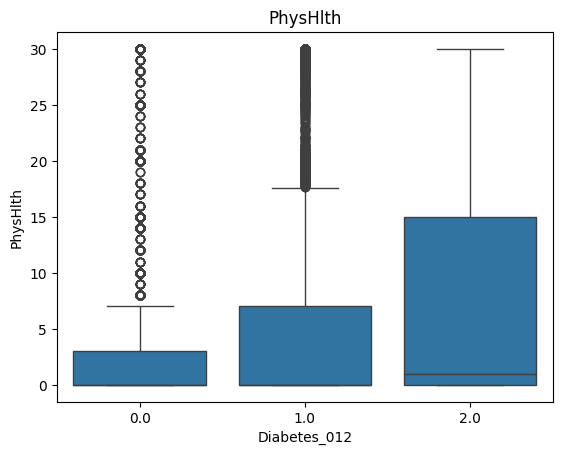

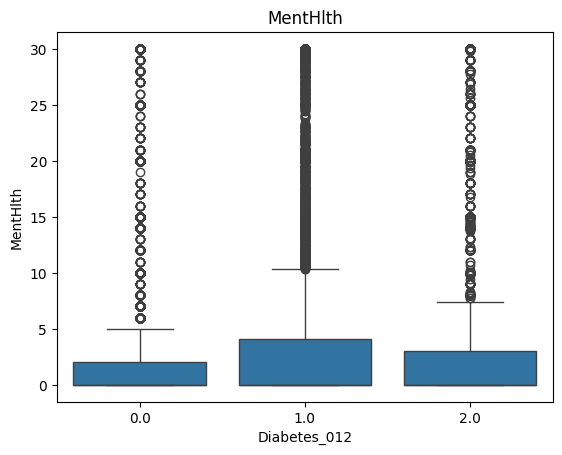

In [97]:
for col in continuous_features:
    sns.boxplot(x=y_train_model, y=X_train_model[col])
    plt.title(col)
    plt.show()


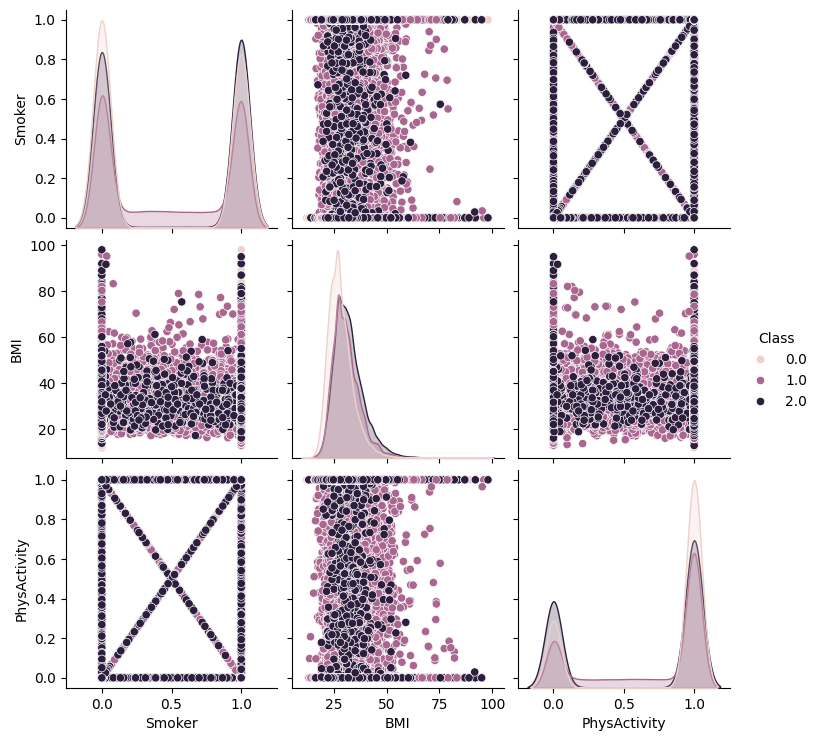

In [98]:
lifestyle_features = ['Smoker', 'BMI', 'PhysActivity']

sns.pairplot(
    X_train_model[lifestyle_features].assign(Class=y_train_model),
    hue='Class'
)
plt.show()


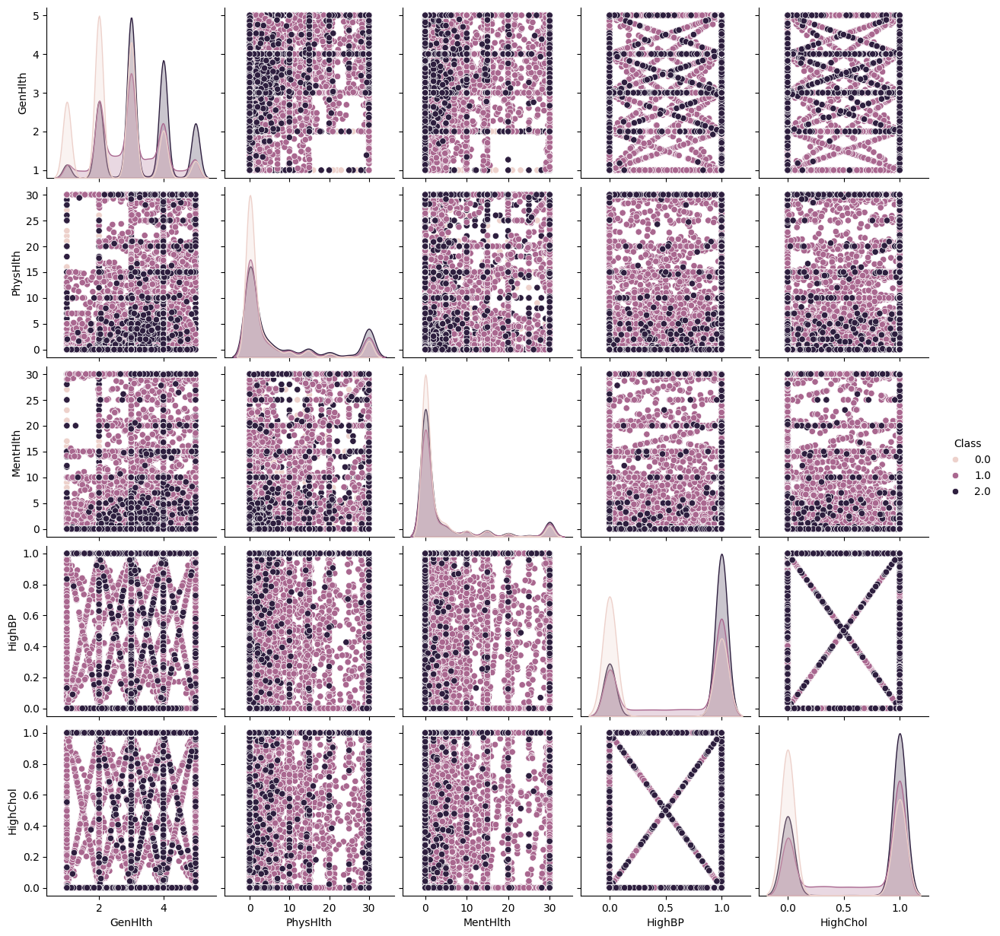

In [99]:
health_features = ['GenHlth', 'PhysHlth', 'MentHlth', 'HighBP', 'HighChol']

sns.pairplot(
    X_train_model[health_features].assign(Class=y_train_model),
    hue='Class'
)
plt.show()


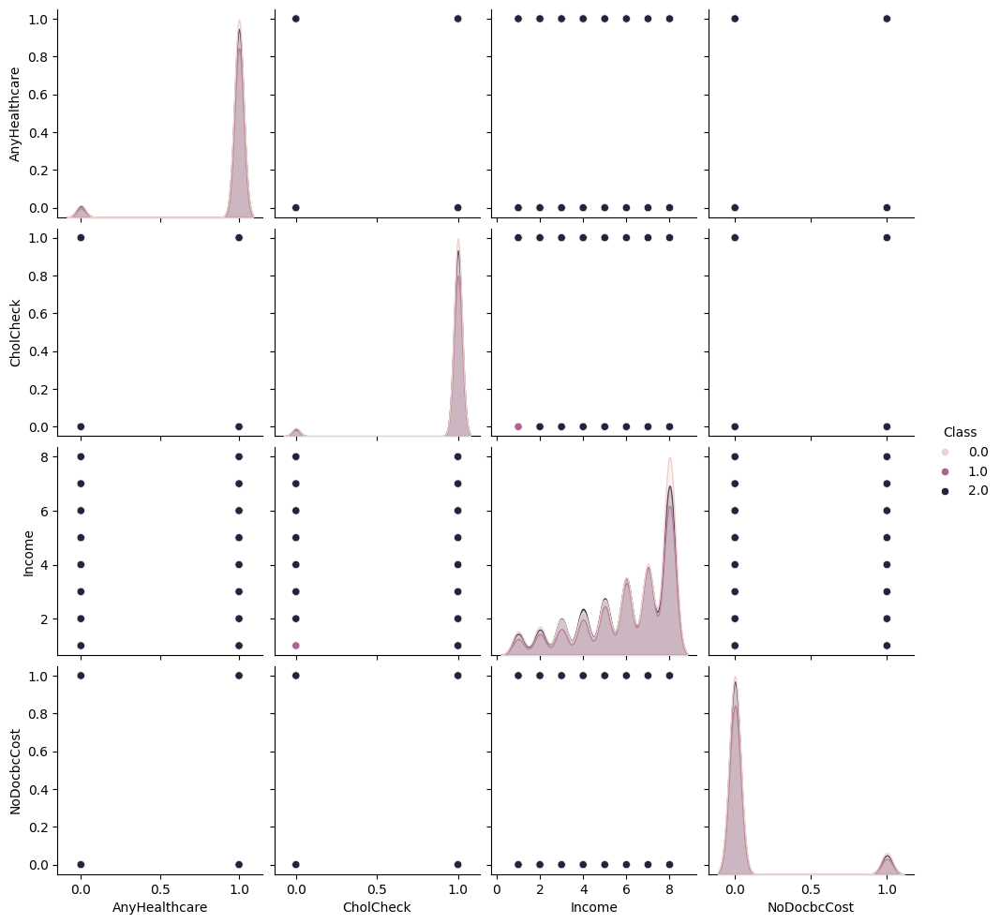

In [102]:
care_features = ['AnyHealthcare', 'CholCheck', 'Income','NoDocbcCost']

sns.pairplot(
    df_fe[care_features].assign(Class=y_train_model),
    hue='Class'
)
plt.show()


In [105]:
X.columns

Index(['HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker', 'Stroke',
       'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education', 'Income',
       'health_burden', 'lifestyle_risk', 'phys_mental_ratio', 'bmi_diffwalk',
       'care_access'],
      dtype='object')

C:\Users\ssriv\AppData\Local\Temp\ipykernel_22616\4258826822.py:42: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
C:\Users\ssriv\AppData\Local\Temp\ipykernel_22616\4258826822.py:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0, 1].set_xticklabels(['Healthy', 'Pre-Diabetic', 'Diabetic'])


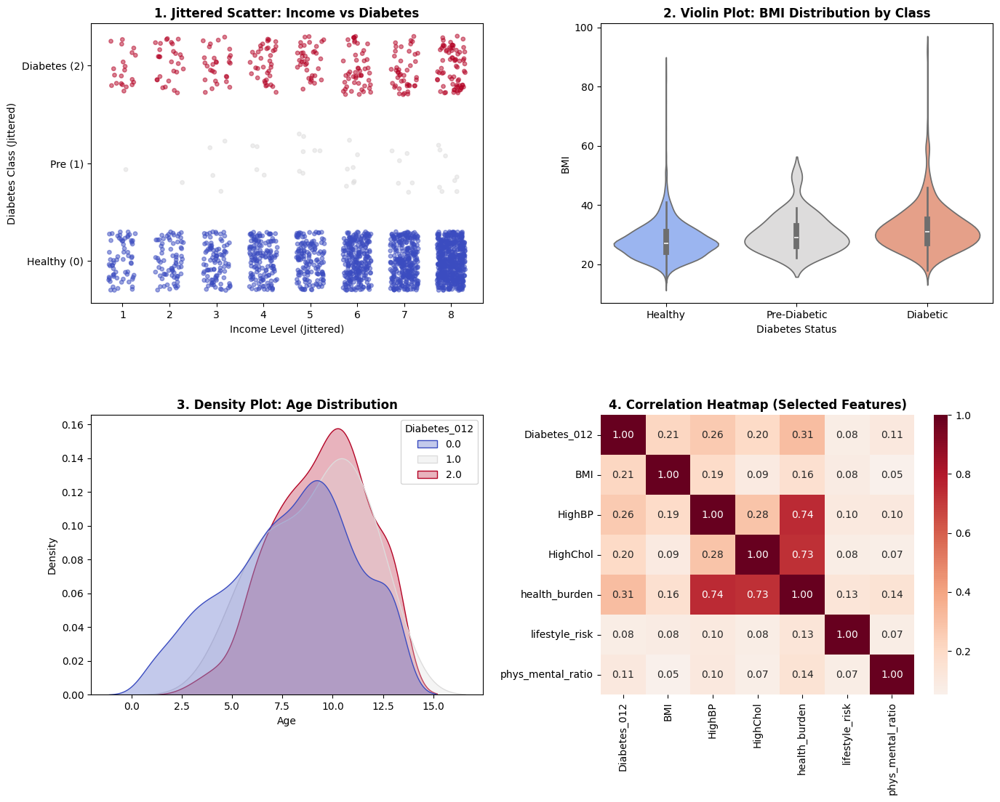

In [103]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. SAMPLE THE DATA
# Plotting 230k points in a scatter plot is slow and unreadable. 
# We take a random sample of 2,000 rows for the Scatter & Violin plots.
# (We will use the FULL dataset for the Heatmap).
df_sample = df_fe.sample(n=2000, random_state=42).copy()

# Set up the figure
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
plt.subplots_adjust(hspace=0.4, wspace=0.3)

# -------------------------------------------------------
# A. JITTERED SCATTER PLOT (Income vs Diabetes)
# -------------------------------------------------------
# We add random noise to the distinct integer values so they don't overlap.
jitter_income = df_sample['Income'] + np.random.uniform(-0.3, 0.3, size=len(df_sample))
jitter_class = df_sample['Diabetes_012'] + np.random.uniform(-0.3, 0.3, size=len(df_sample))

scatter = axes[0, 0].scatter(
    x=jitter_income, 
    y=jitter_class, 
    c=df_sample['Diabetes_012'], 
    cmap='coolwarm', 
    alpha=0.5, 
    s=15
)
axes[0, 0].set_title("1. Jittered Scatter: Income vs Diabetes", fontsize=12, fontweight='bold')
axes[0, 0].set_xlabel("Income Level (Jittered)")
axes[0, 0].set_ylabel("Diabetes Class (Jittered)")
axes[0, 0].set_yticks([0, 1, 2])
axes[0, 0].set_yticklabels(['Healthy (0)', 'Pre (1)', 'Diabetes (2)'])

# -------------------------------------------------------
# B. VIOLIN PLOT (BMI vs Diabetes)
# -------------------------------------------------------
# 
# Violin plots are perfect here because BMI is continuous. 
# It shows if the "bulge" of data moves up as Diabetes class increases.
sns.violinplot(
    data=df_sample, 
    x='Diabetes_012', 
    y='BMI', 
    palette='coolwarm', 
    ax=axes[0, 1]
)
axes[0, 1].set_title("2. Violin Plot: BMI Distribution by Class", fontsize=12, fontweight='bold')
axes[0, 1].set_xlabel("Diabetes Status")
axes[0, 1].set_xticklabels(['Healthy', 'Pre-Diabetic', 'Diabetic'])

# -------------------------------------------------------
# C. KDE PLOT (Age vs Diabetes)
# -------------------------------------------------------
# Age is a strong predictor. This shows the "mountain" of age for each class.
sns.kdeplot(
    data=df_sample, 
    x='Age', 
    hue='Diabetes_012', 
    palette='coolwarm', 
    fill=True, 
    common_norm=False, 
    alpha=0.3, 
    ax=axes[1, 0]
)
axes[1, 0].set_title("3. Density Plot: Age Distribution", fontsize=12, fontweight='bold')

# -------------------------------------------------------
# D. CORRELATION HEATMAP (Engineered Features)
# -------------------------------------------------------
# We select specific columns to see how your new features interact.
cols_to_corr = [
    'Diabetes_012', 'BMI', 'HighBP', 'HighChol', 
    'health_burden', 'lifestyle_risk', 'phys_mental_ratio'
]

# Use the FULL dataframe (df_fe) for accuracy here, not the sample
corr_matrix = df_fe[cols_to_corr].corr()

sns.heatmap(
    corr_matrix, 
    annot=True, 
    fmt=".2f", 
    cmap='RdBu_r', 
    center=0, 
    ax=axes[1, 1]
)
axes[1, 1].set_title("4. Correlation Heatmap (Selected Features)", fontsize=12, fontweight='bold')

plt.show()

In [106]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN
from mlxtend.frequent_patterns import apriori, association_rules

# 1. Scaling for PCA/Clustering
scaler = StandardScaler()
df_scaled = scaler.fit_transform(X)

# 2. PCA
pca = PCA(n_components=0.80) # Keep 80% variance
df_pca = pca.fit_transform(df_scaled)

# 3. K-Means
kmeans = KMeans(n_clusters=3, random_state=42).fit(df_pca)
X['KMeans_Cluster'] = kmeans.labels_

# 4. Association Rules (on binary columns only)
binary_cols = ['HighBP', 'HighChol', 'Smoker', 'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'DiffWalk']
frequent_itemsets = apriori(X[binary_cols], min_support=0.1, use_colnames=True)
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=1.2)

c:\Users\ssriv\anaconda3\envs\warlord\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:161: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


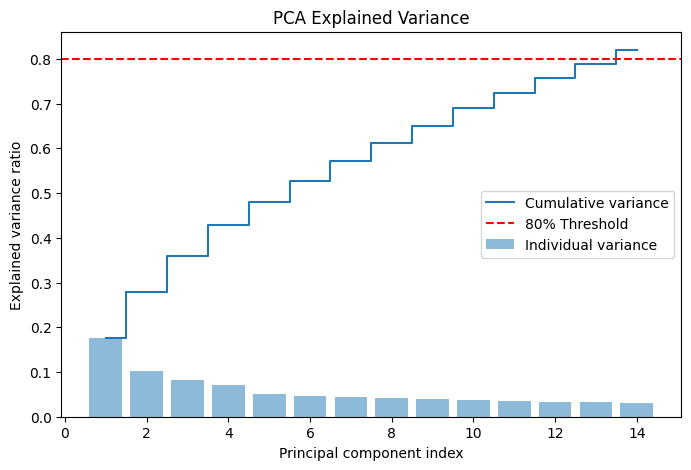

In [107]:
import matplotlib.pyplot as plt
import numpy as np

# Scree Plot
plt.figure(figsize=(8, 5))
exp_var_cumul = np.cumsum(pca.explained_variance_ratio_)

plt.bar(range(1, len(exp_var_cumul) + 1), pca.explained_variance_ratio_, alpha=0.5, align='center', label='Individual variance')
plt.step(range(1, len(exp_var_cumul) + 1), exp_var_cumul, where='mid', label='Cumulative variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.axhline(y=0.8, color='r', linestyle='--', label='80% Threshold')
plt.legend(loc='best')
plt.title('PCA Explained Variance')
plt.show()  

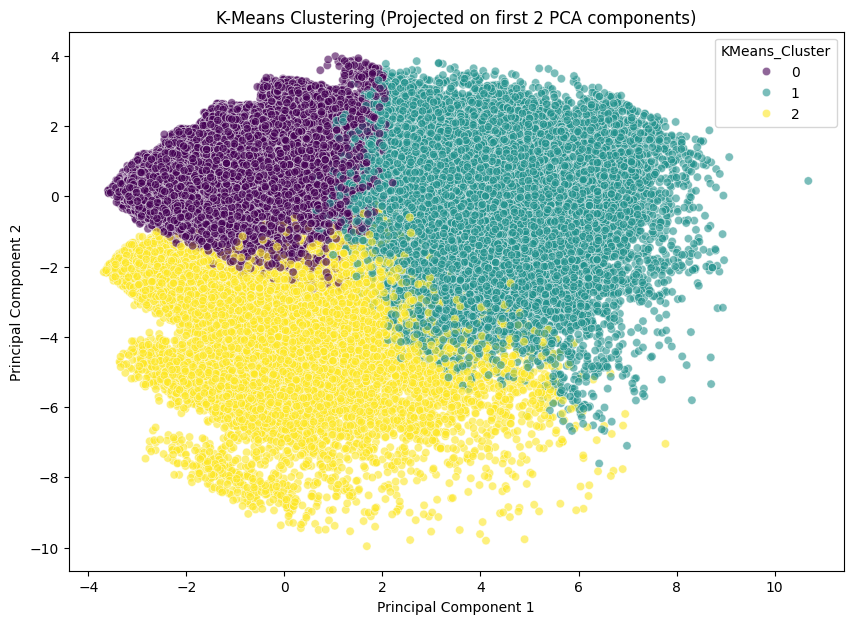

In [108]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x=df_pca[:, 0], y=df_pca[:, 1], hue=X['KMeans_Cluster'], palette='viridis', alpha=0.6)
plt.title('K-Means Clustering (Projected on first 2 PCA components)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

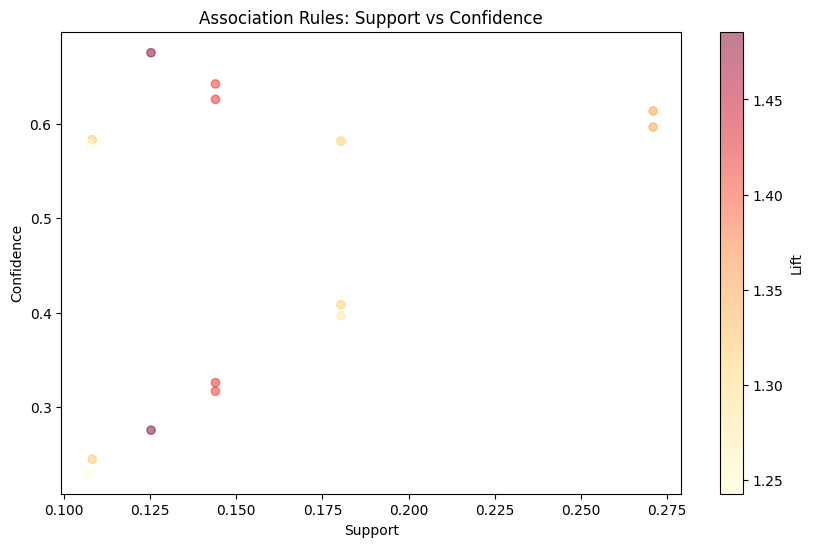

In [109]:
plt.figure(figsize=(10, 6))
plt.scatter(rules['support'], rules['confidence'], alpha=0.5, c=rules['lift'], cmap='YlOrRd')
plt.colorbar(label='Lift')
plt.title('Association Rules: Support vs Confidence')
plt.xlabel('Support')
plt.ylabel('Confidence')
plt.show()

In [110]:
# Group by cluster and look at the means of key features
cluster_profile = X.groupby('KMeans_Cluster')[['health_burden', 'BMI', 'Income', 'Age', 'HighBP']].mean()
print(cluster_profile)

                health_burden        BMI    Income       Age    HighBP
KMeans_Cluster                                                        
0                    0.884878  27.973855  6.424651  7.964963  0.399169
1                    1.820840  31.374055  4.471814  9.591984  0.740920
2                    0.645605  28.150511  5.337573  6.328991  0.289089


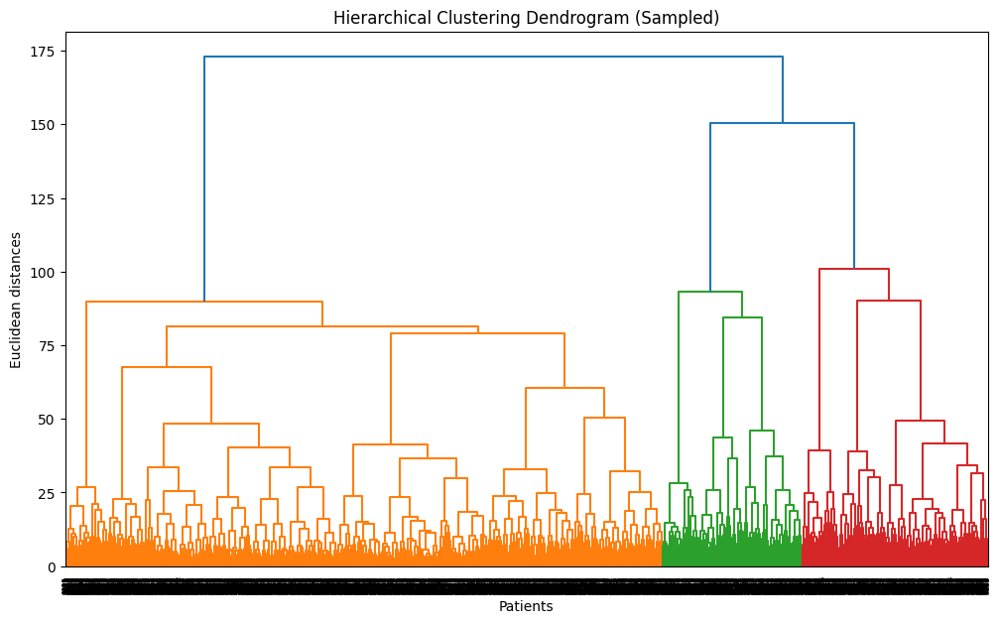

In [111]:
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering

# Sampling for memory efficiency
df_sample = X.sample(5000, random_state=42)
scaler = StandardScaler()
sample_scaled = scaler.fit_transform(df_sample)

# Generate Dendrogram
plt.figure(figsize=(12, 7))
dendrogram = sch.dendrogram(sch.linkage(sample_scaled, method='ward'))
plt.title('Hierarchical Clustering Dendrogram (Sampled)')
plt.xlabel('Patients')
plt.ylabel('Euclidean distances')
plt.show()

In [112]:
from sklearn.cluster import DBSCAN

# Use PCA to reduce dimensions to 2 or 3 for DBSCAN performance
pca_db = PCA(n_components=2)
df_pca_db = pca_db.fit_transform(df_scaled) # Using the full scaled dataset

# We use a small epsilon (eps) because data is standardized (mean 0, std 1)
dbscan = DBSCAN(eps=0.5, min_samples=100) 
db_clusters = dbscan.fit_predict(df_pca_db)

X['DBSCAN_Cluster'] = db_clusters

In [115]:
X['DBSCAN_Cluster']

0         0
1        -1
2         0
3         0
4         0
         ..
253675    0
253676    0
253677    0
253678    0
253679    0
Name: DBSCAN_Cluster, Length: 229781, dtype: int64

In [120]:
from mlxtend.frequent_patterns import fpgrowth, association_rules

# Use binary health indicators
binary_data = X[['HighBP', 'HighChol', 'Stroke', 'HeartDiseaseorAttack', 'Smoker']]

# Using FP-Growth (faster than Apriori for large datasets)
freq_items = fpgrowth(binary_data, min_support=0.05, use_colnames=True)
rules = association_rules(freq_items, metric="lift", min_threshold=1.5)

# Sorting by 'confidence' to see the strongest predictors
top_rules = rules.sort_values('confidence', ascending=False).head(10)

c:\Users\ssriv\anaconda3\envs\warlord\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:161: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


In [121]:
freq_items

,support,itemsets
0,0.465661,(Smoker)
1,0.454441,(HighBP)
2,0.441760,(HighChol)
3,0.103216,(HeartDiseaseorAttack)
4,0.230054,"(HighBP, Smoker)"
5,0.271023,"(HighBP, HighChol)"
6,0.224196,"(Smoker, HighChol)"
7,0.143954,"(HighBP, Smoker, HighChol)"
8,0.077395,"(HighBP, HeartDiseaseorAttack)"
9,0.072230,"(HighChol, HeartDiseaseorAttack)"


In [122]:
df_fe

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,DiffWalk,Sex,Age,Education,Income,health_burden,lifestyle_risk,phys_mental_ratio,bmi_diffwalk,care_access
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,9.0,4.0,3.0,2.0,3.0,0.789474,40.0,2.0
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,7.0,6.0,1.0,0.0,3.0,0.000000,0.0,-1.0
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,9.0,4.0,8.0,2.0,2.0,0.967742,28.0,1.0
3,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,11.0,3.0,6.0,1.0,0.0,0.000000,0.0,2.0
4,0.0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,11.0,5.0,4.0,2.0,0.0,0.000000,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253675,0.0,1.0,1.0,1.0,45.0,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,5.0,6.0,7.0,2.0,1.0,5.000000,0.0,2.0
253676,2.0,1.0,1.0,1.0,18.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,11.0,2.0,4.0,2.0,3.0,0.000000,18.0,2.0
253677,0.0,0.0,0.0,1.0,28.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,2.0,5.0,2.0,0.0,1.0,0.000000,0.0,2.0
253678,0.0,1.0,0.0,1.0,23.0,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,7.0,5.0,1.0,1.0,1.0,0.000000,0.0,2.0


In [125]:
df_fe.columns

Index(['Diabetes_012', 'HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker',
       'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education', 'Income',
       'health_burden', 'lifestyle_risk', 'phys_mental_ratio', 'bmi_diffwalk',
       'care_access'],
      dtype='object')

In [127]:
import pandas as pd
import numpy as np

cols_to_use = ['HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker','Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies','HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth','MentHlth', 'PhysHlth', 'Sex', 'Age', 'Education', 'Income','health_burden', 'lifestyle_risk', 'phys_mental_ratio','care_access']
# Create a copy for the itemset analysis
df_rules = df_fe[cols_to_use]

# ==========================================
# 1. BINNING CONTINUOUS VARIABLES
# ==========================================

# BMI: Standard Medical Ranges
# <18.5 (Under), 18.5-25 (Normal), 25-30 (Over), >30 (Obese)
df_rules['BMI_Cat'] = pd.cut(df_rules['BMI'], 
                             bins=[0, 18.5, 25, 30, 100], 
                             labels=['Underweight', 'NormalWeight', 'Overweight', 'Obese'])

# Mental & Physical Health (Days per month: 0-30)
# 0 days = Good, 1-13 = Occasional, 14+ = Frequent Distress
df_rules['MentHlth_Cat'] = pd.cut(df_rules['MentHlth'], 
                                  bins=[-1, 0, 13, 31], 
                                  labels=['MentHlth_None', 'MentHlth_Occasional', 'MentHlth_Frequent'])

df_rules['PhysHlth_Cat'] = pd.cut(df_rules['PhysHlth'], 
                                  bins=[-1, 0, 13, 31], 
                                  labels=['PhysHlth_None', 'PhysHlth_Occasional', 'PhysHlth_Frequent'])

# Age (BRFSS bands 1-13). Grouping for cleaner rules.
# 1-3 (18-34), 4-9 (35-64), 10-13 (65+)
df_rules['Age_Group'] = pd.cut(df_rules['Age'], 
                               bins=[0, 3, 9, 14], 
                               labels=['Young_Adult', 'Middle_Aged', 'Senior'])

# ==========================================
# 2. SELECTING COLUMNS TO ENCODE
# ==========================================

# A. Columns that are ALREADY Binary (0/1) - Keep as is
# Note: 'Veggies' and 'Fruits' are typically binary in BRFSS. 
# If yours are 0/1, keep them here. If they are counts, move to section B.
binary_cols = [
    'HighBP', 'HighChol', 'CholCheck', 'Smoker', 'Stroke', 
    'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies', 
    'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 
    'Sex', 'care_access'
]

# B. Columns to One-Hot Encode (Categorical + The Binned ones created above)
# We cast to 'str' first so column names look like "Income_8" instead of "Income_8.0"
cols_to_encode = ['GenHlth', 'Education', 'Income', 'BMI_Cat', 'MentHlth_Cat', 'PhysHlth_Cat', 'Age_Group']
df_rules[cols_to_encode] = df_rules[cols_to_encode].astype(str)

# ==========================================
# 3. PERFORM ONE-HOT ENCODING
# ==========================================

# get_dummies creates the binary flags
df_encoded = pd.get_dummies(df_rules[cols_to_encode], prefix_sep='_')

# Combine with the original binary columns
df_final_rules = pd.concat([df_rules[binary_cols], df_encoded], axis=1)

# Ensure everything is strictly 0 or 1 (Integers) for Apriori
df_final_rules = df_final_rules.astype(int)

# VIEW RESULT
print(f"Original Shape: {df_fe.shape}")
print(f"New Binary Shape: {df_final_rules.shape}")
print("Columns:", df_final_rules.columns.tolist()[:10]) # First 10 columns

C:\Users\ssriv\AppData\Local\Temp\ipykernel_22616\147329207.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rules['BMI_Cat'] = pd.cut(df_rules['BMI'],
C:\Users\ssriv\AppData\Local\Temp\ipykernel_22616\147329207.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rules['MentHlth_Cat'] = pd.cut(df_rules['MentHlth'],


Original Shape: (229781, 27)
New Binary Shape: (229781, 46)
Columns: ['HighBP', 'HighChol', 'CholCheck', 'Smoker', 'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies', 'HvyAlcoholConsump']


In [ ]:
top_rules1

In [128]:
df_encoded

,GenHlth_1.0,GenHlth_2.0,GenHlth_3.0,GenHlth_4.0,GenHlth_5.0,Education_1.0,Education_2.0,Education_3.0,Education_4.0,Education_5.0,...,BMI_Cat_Underweight,MentHlth_Cat_MentHlth_Frequent,MentHlth_Cat_MentHlth_None,MentHlth_Cat_MentHlth_Occasional,PhysHlth_Cat_PhysHlth_Frequent,PhysHlth_Cat_PhysHlth_None,PhysHlth_Cat_PhysHlth_Occasional,Age_Group_Middle_Aged,Age_Group_Senior,Age_Group_Young_Adult
0,False,False,False,False,True,False,False,False,True,False,...,False,True,False,False,True,False,False,True,False,False
1,False,False,True,False,False,False,False,False,False,False,...,False,False,True,False,False,True,False,True,False,False
2,False,False,False,False,True,False,False,False,True,False,...,False,True,False,False,True,False,False,True,False,False
3,False,True,False,False,False,False,False,True,False,False,...,False,False,True,False,False,True,False,False,True,False
4,False,True,False,False,False,False,False,False,False,True,...,False,False,False,True,False,True,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253675,False,False,True,False,False,False,False,False,False,False,...,False,False,True,False,False,False,True,True,False,False
253676,False,False,False,True,False,False,True,False,False,False,...,True,False,True,False,False,True,False,False,True,False
253677,True,False,False,False,False,False,False,False,False,True,...,False,False,True,False,False,True,False,False,False,True
253678,False,False,True,False,False,False,False,False,False,True,...,False,False,True,False,False,True,False,True,False,False


In [130]:
df_final_rules.columns

Index(['HighBP', 'HighChol', 'CholCheck', 'Smoker', 'Stroke',
       'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'Sex',
       'care_access', 'GenHlth_1.0', 'GenHlth_2.0', 'GenHlth_3.0',
       'GenHlth_4.0', 'GenHlth_5.0', 'Education_1.0', 'Education_2.0',
       'Education_3.0', 'Education_4.0', 'Education_5.0', 'Education_6.0',
       'Income_1.0', 'Income_2.0', 'Income_3.0', 'Income_4.0', 'Income_5.0',
       'Income_6.0', 'Income_7.0', 'Income_8.0', 'BMI_Cat_NormalWeight',
       'BMI_Cat_Obese', 'BMI_Cat_Overweight', 'BMI_Cat_Underweight',
       'MentHlth_Cat_MentHlth_Frequent', 'MentHlth_Cat_MentHlth_None',
       'MentHlth_Cat_MentHlth_Occasional', 'PhysHlth_Cat_PhysHlth_Frequent',
       'PhysHlth_Cat_PhysHlth_None', 'PhysHlth_Cat_PhysHlth_Occasional',
       'Age_Group_Middle_Aged', 'Age_Group_Senior', 'Age_Group_Young_Adult'],
      dtype='object')

In [139]:
bin_features = ['HighBP', 'HighChol', 'CholCheck', 'Smoker', 'Stroke',
       'HeartDiseaseorAttack', 'PhysActivity',  'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'Sex', 'GenHlth_1.0', 'GenHlth_2.0', 'GenHlth_3.0',
       'GenHlth_4.0', 'GenHlth_5.0', 'Education_1.0', 'Education_2.0',
       'Education_3.0', 'Education_4.0', 'Education_5.0', 'Education_6.0',
       'Income_1.0', 'Income_2.0', 'Income_3.0', 'Income_4.0', 'Income_5.0',
       'Income_6.0', 'Income_7.0', 'Income_8.0', 'BMI_Cat_NormalWeight',
       'BMI_Cat_Obese', 'BMI_Cat_Overweight', 'BMI_Cat_Underweight',
       'MentHlth_Cat_MentHlth_Frequent', 'MentHlth_Cat_MentHlth_None',
       'MentHlth_Cat_MentHlth_Occasional', 'PhysHlth_Cat_PhysHlth_Frequent',
       'PhysHlth_Cat_PhysHlth_None', 'PhysHlth_Cat_PhysHlth_Occasional',
       'Age_Group_Middle_Aged', 'Age_Group_Senior', 'Age_Group_Young_Adult']

In [140]:
bin_to_use = df_final_rules[bin_features]
# Using FP-Growth (faster than Apriori for large datasets)
freq_items1 = fpgrowth(bin_to_use, min_support=0.05, use_colnames=True)
rules1 = association_rules(freq_items1, metric="lift", min_threshold=1.5)

# Sorting by 'confidence' to see the strongest predictors
top_rules1 = rules1.sort_values('confidence', ascending=False).head(10)

c:\Users\ssriv\anaconda3\envs\warlord\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:161: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


In [234]:
freq_items1

,support,itemsets
0,0.959535,(CholCheck)
1,0.946075,(AnyHealthcare)
2,0.538600,(Age_Group_Middle_Aged)
3,0.465661,(Smoker)
4,0.454441,(HighBP)
...,...,...
5813,0.054687,"(AnyHealthcare, PhysHlth_Cat_PhysHlth_None, Ge..."
5814,0.053464,"(PhysHlth_Cat_PhysHlth_None, CholCheck, GenHlt..."
5815,0.050935,"(PhysActivity, PhysHlth_Cat_PhysHlth_None, Gen..."
5816,0.050940,"(PhysHlth_Cat_PhysHlth_None, CholCheck, BMI_Ca..."


In [ ]:
top_rules1

In [131]:
top_rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
6,"(HighChol, HeartDiseaseorAttack)",(HighBP),0.072230,0.454441,0.058882,0.815208,1.793867,1.0,0.026058,2.952278,0.476999,0.125873,0.661278,0.472389
5,"(HighBP, HeartDiseaseorAttack)",(HighChol),0.077395,0.441760,0.058882,0.760796,1.722194,1.0,0.024692,2.333743,0.454524,0.127929,0.571504,0.447043
1,(HeartDiseaseorAttack),(HighBP),0.103216,0.454441,0.077395,0.749842,1.650030,1.0,0.030490,2.180855,0.439292,0.161153,0.541464,0.460075
3,(HeartDiseaseorAttack),(HighChol),0.103216,0.441760,0.072230,0.699793,1.584104,1.0,0.026633,1.859520,0.411167,0.152787,0.462227,0.431649
9,(HeartDiseaseorAttack),"(HighBP, HighChol)",0.103216,0.271023,0.058882,0.570477,2.104900,1.0,0.030908,1.697177,0.585334,0.186716,0.410786,0.393868
4,"(HighBP, HighChol)",(HeartDiseaseorAttack),0.271023,0.103216,0.058882,0.217259,2.104900,1.0,0.030908,1.145697,0.720075,0.186716,0.127169,0.393868
0,(HighBP),(HeartDiseaseorAttack),0.454441,0.103216,0.077395,0.170309,1.650030,1.0,0.030490,1.080865,0.722105,0.161153,0.074815,0.460075
2,(HighChol),(HeartDiseaseorAttack),0.441760,0.103216,0.072230,0.163504,1.584104,1.0,0.026633,1.072073,0.660519,0.152787,0.067228,0.431649
8,(HighChol),"(HighBP, HeartDiseaseorAttack)",0.441760,0.077395,0.058882,0.133290,1.722194,1.0,0.024692,1.064490,0.751192,0.127929,0.060583,0.447043
7,(HighBP),"(HighChol, HeartDiseaseorAttack)",0.454441,0.072230,0.058882,0.129570,1.793867,1.0,0.026058,1.065876,0.811178,0.125873,0.061805,0.472389


In [116]:
df_fe.describe()

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,DiffWalk,Sex,Age,Education,Income,health_burden,lifestyle_risk,phys_mental_ratio,bmi_diffwalk,care_access
count,229781.000000,229781.000000,229781.000000,229781.000000,229781.00000,229781.000000,229781.000000,229781.000000,229781.000000,229781.000000,...,229781.000000,229781.000000,229781.000000,229781.000000,229781.000000,229781.000000,229781.000000,229781.000000,229781.000000,229781.000000
mean,0.325627,0.454441,0.441760,0.959535,28.68567,0.465661,0.044756,0.103216,0.733355,0.612966,...,0.185507,0.439231,8.086582,4.980568,5.890383,1.044172,1.385236,2.515669,5.803086,1.812800
std,0.724623,0.497921,0.496598,0.197047,6.78636,0.498821,0.206767,0.304241,0.442206,0.487073,...,0.388709,0.496295,3.093809,0.992895,2.092477,0.976528,1.088040,6.535131,12.661519,0.469426
min,0.000000,0.000000,0.000000,0.000000,12.00000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,-1.000000
25%,0.000000,0.000000,0.000000,1.000000,24.00000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,6.000000,4.000000,5.000000,0.000000,1.000000,0.000000,0.000000,2.000000
50%,0.000000,0.000000,0.000000,1.000000,27.00000,0.000000,0.000000,0.000000,1.000000,1.000000,...,0.000000,0.000000,8.000000,5.000000,6.000000,1.000000,1.000000,0.000000,0.000000,2.000000
75%,0.000000,1.000000,1.000000,1.000000,32.00000,1.000000,0.000000,0.000000,1.000000,1.000000,...,0.000000,1.000000,10.000000,6.000000,8.000000,2.000000,2.000000,1.153846,0.000000,2.000000
max,2.000000,1.000000,1.000000,1.000000,98.00000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,13.000000,6.000000,8.000000,4.000000,5.000000,30.000000,98.000000,2.000000


In [243]:
df_final_rules.columns

Index(['HighBP', 'HighChol', 'CholCheck', 'Smoker', 'Stroke',
       'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'Sex',
       'care_access', 'GenHlth_1.0', 'GenHlth_2.0', 'GenHlth_3.0',
       'GenHlth_4.0', 'GenHlth_5.0', 'Education_1.0', 'Education_2.0',
       'Education_3.0', 'Education_4.0', 'Education_5.0', 'Education_6.0',
       'Income_1.0', 'Income_2.0', 'Income_3.0', 'Income_4.0', 'Income_5.0',
       'Income_6.0', 'Income_7.0', 'Income_8.0', 'BMI_Cat_NormalWeight',
       'BMI_Cat_Obese', 'BMI_Cat_Overweight', 'BMI_Cat_Underweight',
       'MentHlth_Cat_MentHlth_Frequent', 'MentHlth_Cat_MentHlth_None',
       'MentHlth_Cat_MentHlth_Occasional', 'PhysHlth_Cat_PhysHlth_Frequent',
       'PhysHlth_Cat_PhysHlth_None', 'PhysHlth_Cat_PhysHlth_Occasional',
       'Age_Group_Middle_Aged', 'Age_Group_Senior', 'Age_Group_Young_Adult',
       'DBSCAN_Cluster', 'Cluster'],
      dtype='object')

In [ ]:
df_final_rules.groupby('Cluster')[""]

Original Features: 48
Reduced to Components: 27


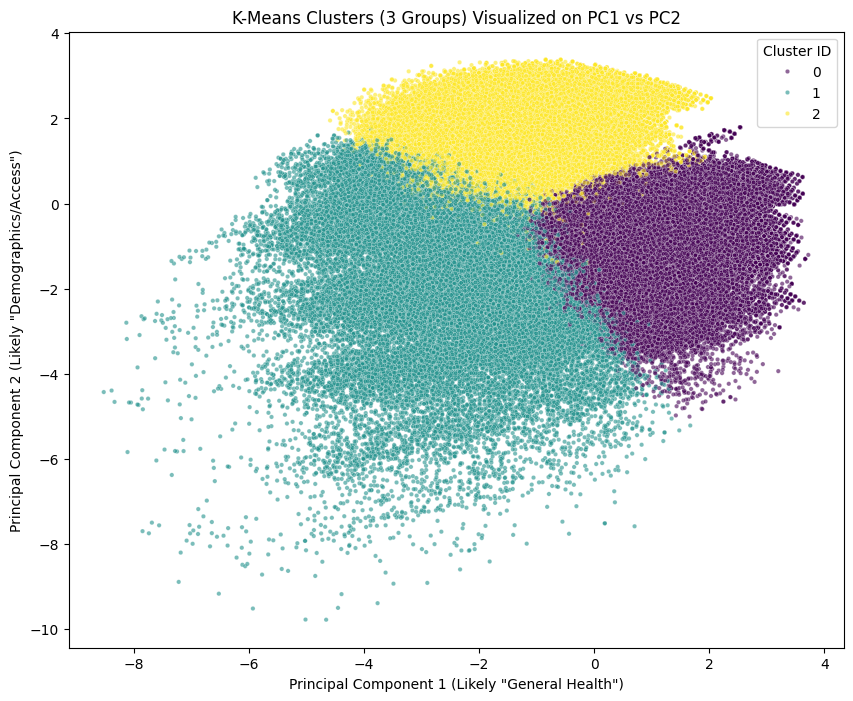

KeyError: "Columns not found: 'PhysHlth', 'BMI', 'Age', 'health_burden', 'MentHlth', 'Income'"

In [247]:
# 1. PREPARE THE DATA
# We use the binary dataset you just created
X = df_final_rules.copy()

# Standardize? 
# For binary data, scaling is debated, but standardizing helps PCA treat 
# rare diseases (like HeartAttack) as equally important to common ones (like HighBP).
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 2. RUN PCA
# We keep 80% of the variance to reduce noise but keep the signal
pca = PCA(n_components=0.80)
X_pca = pca.fit_transform(X_scaled)

print(f"Original Features: {X.shape[1]}")
print(f"Reduced to Components: {X_pca.shape[1]}")

# 3. K-MEANS CLUSTERING (Trying 4 Clusters)
# We run this on the PCA data (X_pca) which is much faster and cleaner
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(X_pca)

# Attach clusters back to the ORIGINAL DataFrame to interpret them
# (We attach to df_fe so we can see the real values like 'BMI=32', not just 'BMI_Obese=1')
df_final_rules['Cluster'] = clusters

# 4. VISUALIZE THE CLUSTERS (2D Projection)
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x=X_pca[:, 0], 
    y=X_pca[:, 1], 
    hue=df_final_rules['Cluster'], 
    palette='viridis', 
    alpha=0.6,
    s=10
)
plt.title('K-Means Clusters (3 Groups) Visualized on PC1 vs PC2')
plt.xlabel('Principal Component 1 (Likely "General Health")')
plt.ylabel('Principal Component 2 (Likely "Demographics/Access")')
plt.legend(title='Cluster ID')
plt.show()

# 5. INTERPRET THE MEANINGFUL CLUSTERS
# This is the most important step: Who are these people?
# We group by the new 'Cluster' column and take the average of key features
# 4. (Modified) Attach clusters back to df_fe, NOT df_final_rules
df_final_rules['Cluster'] = clusters

# 5. INTERPRET THE MEANINGFUL CLUSTERS
# Use df_fe because it contains the actual numeric values for BMI, Age, etc.
numeric_cols = ['BMI', 'Age', 'Income', 'PhysHlth', 'MentHlth', 'health_burden', 'HighBP', 'Smoker']

# Group by the cluster and calculate means
profile = df_final_rules.groupby('Cluster')[numeric_cols].mean()

# Add a count to see the size of each cluster
profile['Count'] = df_final_rules['Cluster'].value_counts()

print("Cluster Profiles (Averages):")
print(profile.round(2))

In [ ]:
def collapse_ohe_to_ordinal(df, prefix, values):
    cols = [f"{prefix}_{v}.0" for v in values if f"{prefix}_{v}.0" in df.columns]
    
    if not cols:
        raise ValueError(f"No columns found for {prefix}")
    
    return (
        df[cols]
        .idxmax(axis=1)
        .str.extract(r'(\d+)')
        .astype(int)
    )


In [163]:
df_bin = df_final_rules.copy()

df_bin['GenHlth_ord'] = collapse_ohe_to_ordinal(df_bin, 'GenHlth', range(1, 6))
df_bin['Education_ord'] = collapse_ohe_to_ordinal(df_bin, 'Education', range(1, 7))
df_bin['Income_ord'] = collapse_ohe_to_ordinal(df_bin, 'Income', range(1, 9))
age_map = {
    'Age_Group_Young_Adult': 1,
    'Age_Group_Middle_Aged': 2,
    'Age_Group_Senior': 3
}

df_bin['Age_ord'] = sum(df_bin[k] * v for k, v in age_map.items())



In [164]:
df_bin[['GenHlth_ord', 'Education_ord', 'Income_ord', 'Age_ord']].describe()


,GenHlth_ord,Education_ord,Income_ord,Age_ord
count,229781.000000,229781.000000,229781.000000,229781.000000
mean,2.601151,4.980568,5.890383,2.264648
std,1.064685,0.992895,2.092477,0.625591
min,1.000000,1.000000,1.000000,1.000000
25%,2.000000,4.000000,5.000000,2.000000
50%,3.000000,5.000000,6.000000,2.000000
75%,3.000000,6.000000,8.000000,3.000000
max,5.000000,6.000000,8.000000,3.000000


In [165]:
'''cluster_features = [
    # Cardiometabolic
    'HighBP', 'HighChol', 'HeartDiseaseorAttack', 'Stroke',

    # Lifestyle
    'Smoker', 'PhysActivity', 'HvyAlcoholConsump',

    # Access
    'AnyHealthcare', 'NoDocbcCost',

    # Ordinal health & SES
    'GenHlth_ord', 'Education_ord', 'Income_ord', 'Age_ord'
]

X = df_bin[cluster_features]
'''

"cluster_features = [\n    # Cardiometabolic\n    'HighBP', 'HighChol', 'HeartDiseaseorAttack', 'Stroke',\n\n    # Lifestyle\n    'Smoker', 'PhysActivity', 'HvyAlcoholConsump',\n\n    # Access\n    'AnyHealthcare', 'NoDocbcCost',\n\n    # Ordinal health & SES\n    'GenHlth_ord', 'Education_ord', 'Income_ord', 'Age_ord'\n]\n\nX = df_bin[cluster_features]\n"

In [166]:
cluster_features = [
    # Cardiometabolic
    'HighBP', 'HighChol', 'HeartDiseaseorAttack', 'Stroke',

    # Lifestyle
    'Smoker', 'PhysActivity', 'HvyAlcoholConsump',
    'BMI_Cat_NormalWeight', 'BMI_Cat_Overweight',
    'BMI_Cat_Obese', 'BMI_Cat_Underweight',

    # Health burden
    'PhysHlth_Cat_PhysHlth_None',
    'PhysHlth_Cat_PhysHlth_Occasional',
    'PhysHlth_Cat_PhysHlth_Frequent',
    'MentHlth_Cat_MentHlth_None',
    'MentHlth_Cat_MentHlth_Occasional',
    'MentHlth_Cat_MentHlth_Frequent',

    # Access + demographics
    'AnyHealthcare', 'NoDocbcCost', 'Sex',
    'GenHlth_ord', 'Education_ord', 'Income_ord', 'Age_ord'
]

X = df_bin[cluster_features]


In [ ]:
# Using FP-Growth (faster than Apriori for large datasets)
freq_items = fpgrowth(X, min_support=0.05, use_colnames=True)
rules = association_rules(freq_items, metric="lift", min_threshold=1.5)

# Sorting by 'confidence' to see the strongest predictors
top_rules = rules.sort_values('confidence', ascending=False).head(10)

In [167]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


In [ ]:
X_scaled

In [168]:
from sklearn.decomposition import PCA
import numpy as np

pca = PCA(n_components=0.80, random_state=42)
X_pca = pca.fit_transform(X_scaled)

print(f"Original dims: {X.shape[1]}")
print(f"PCA dims (80% var): {X_pca.shape[1]}")


Original dims: 24
PCA dims (80% var): 14


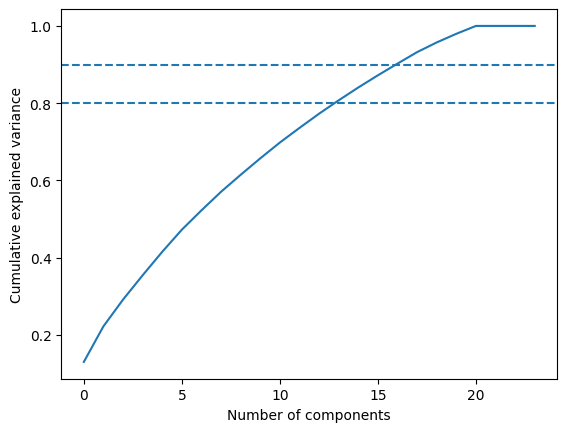

In [169]:
import matplotlib.pyplot as plt
import numpy as np

pca_full = PCA().fit(X_scaled)
plt.plot(np.cumsum(pca_full.explained_variance_ratio_))
plt.axhline(0.80, linestyle='--')
plt.axhline(0.90, linestyle='--')
plt.xlabel("Number of components")
plt.ylabel("Cumulative explained variance")
plt.show()


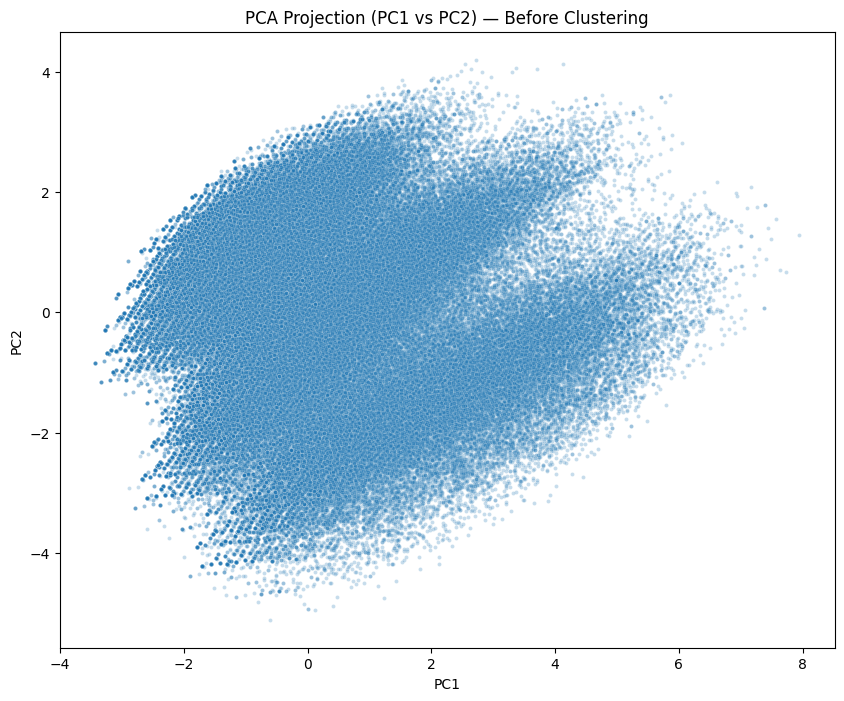

In [170]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 8))
sns.scatterplot(
    x=X_pca[:, 0],
    y=X_pca[:, 1],
    alpha=0.25,
    s=8
)

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA Projection (PC1 vs PC2) — Before Clustering")
plt.show()


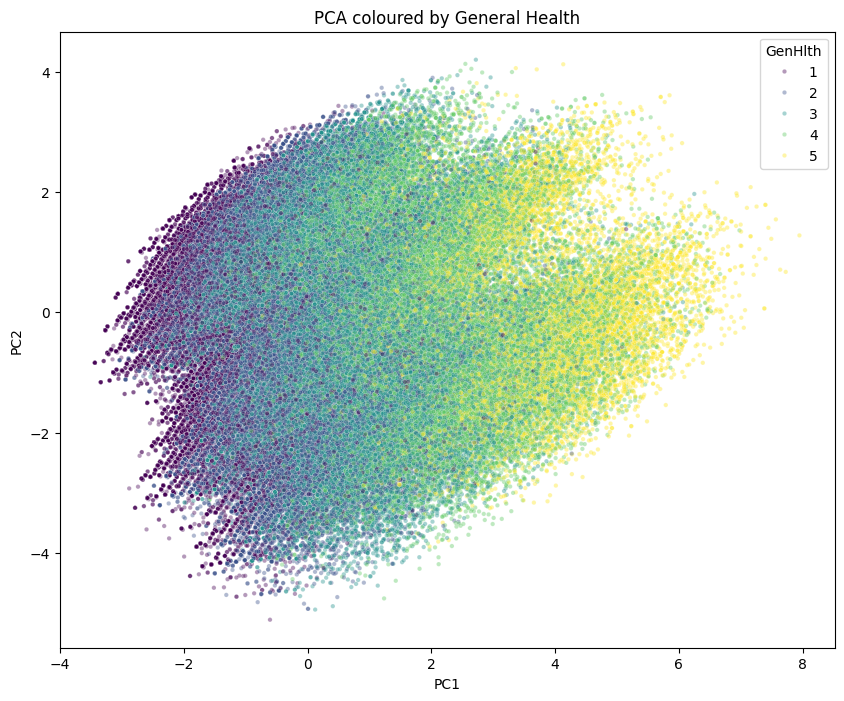

In [171]:
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x=X_pca[:, 0],
    y=X_pca[:, 1],
    hue=df_bin['GenHlth_ord'],
    palette='viridis',
    alpha=0.4,
    s=10
)

plt.title("PCA coloured by General Health")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend(title="GenHlth")
plt.show()


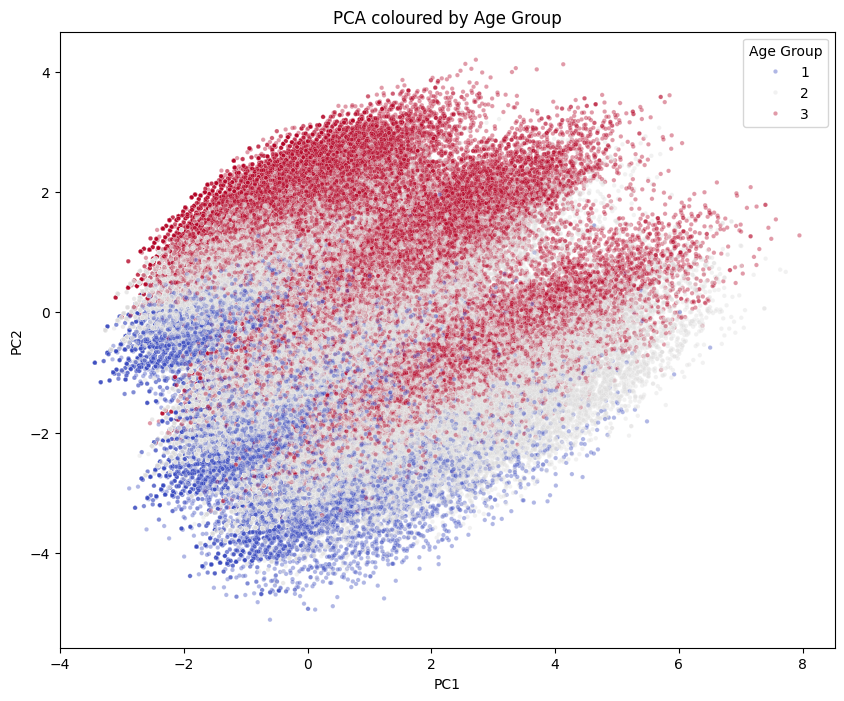

In [172]:
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x=X_pca[:, 0],
    y=X_pca[:, 1],
    hue=df_bin['Age_ord'],
    palette='coolwarm',
    alpha=0.4,
    s=10
)

plt.title("PCA coloured by Age Group")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend(title="Age Group")
plt.show()


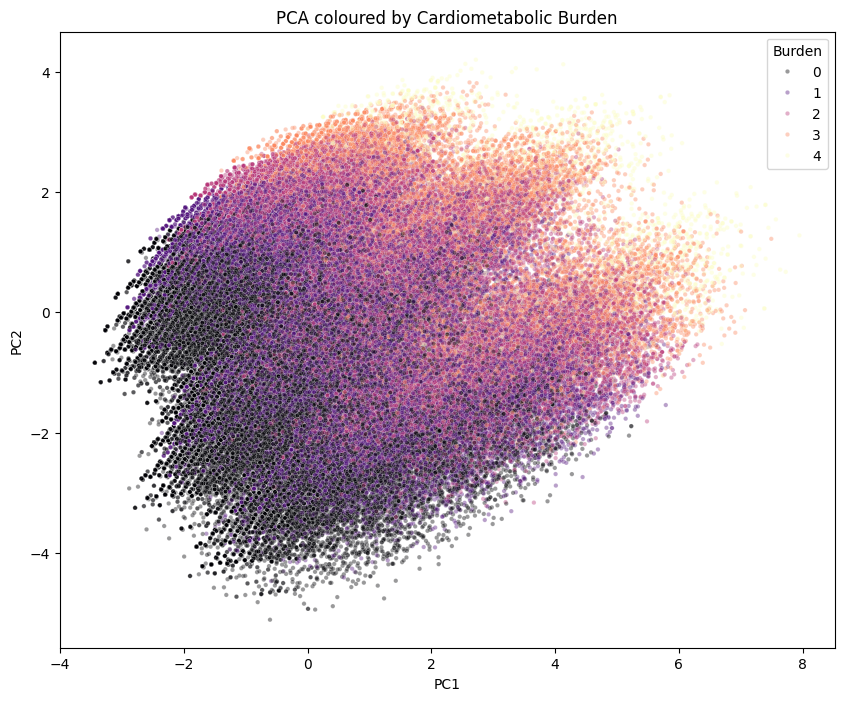

In [173]:
df_bin['cardio_burden'] = (
    df_bin['HighBP']
    + df_bin['HighChol']
    + df_bin['HeartDiseaseorAttack']
    + df_bin['Stroke']
)

plt.figure(figsize=(10, 8))
sns.scatterplot(
    x=X_pca[:, 0],
    y=X_pca[:, 1],
    hue=df_bin['cardio_burden'],
    palette='magma',
    alpha=0.4,
    s=10
)

plt.title("PCA coloured by Cardiometabolic Burden")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend(title="Burden")
plt.show()


In [174]:
loadings = pd.DataFrame(
    pca.components_.T,
    index=X.columns,
    columns=[f'PC{i+1}' for i in range(X_pca.shape[1])]
)

loadings[['PC1', 'PC2', 'PC3']].sort_values('PC1', ascending=False).head(10)


,PC1,PC2,PC3
GenHlth_ord,0.426531,0.047037,-0.006423
PhysHlth_Cat_PhysHlth_Frequent,0.363362,-0.003665,-0.109991
MentHlth_Cat_MentHlth_Frequent,0.265661,-0.150867,-0.191984
HighBP,0.232041,0.259617,0.199130
HeartDiseaseorAttack,0.206797,0.184660,0.123151
HighChol,0.178487,0.188681,0.227551
BMI_Cat_Obese,0.176293,0.034077,-0.011155
Stroke,0.162974,0.098863,0.050341
NoDocbcCost,0.159566,-0.147395,-0.240379
Smoker,0.126600,0.103632,-0.053909


In [175]:
X = df_bin[cluster_features]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

pca = PCA(n_components=0.80, random_state=42)
X_pca = pca.fit_transform(X_scaled)


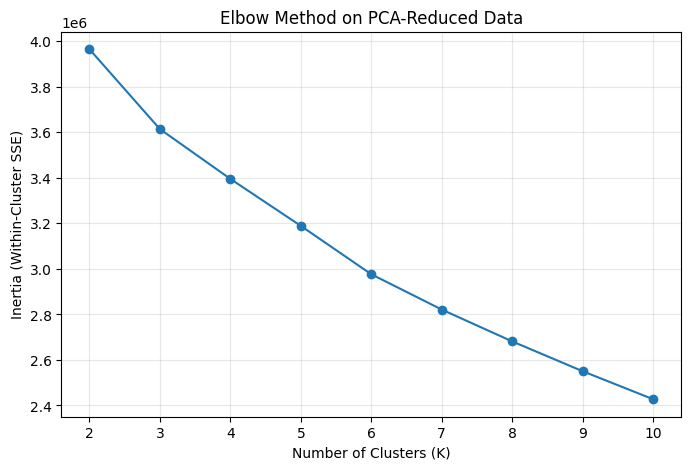

In [205]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

inertias = []
K_range = range(2, 11)

for k in K_range:
    kmeans = KMeans(
        n_clusters=k,
        random_state=42,
        n_init=20
    )
    kmeans.fit(X_pca)
    inertias.append(kmeans.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(K_range, inertias, marker='o')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Inertia (Within-Cluster SSE)")
plt.title("Elbow Method on PCA-Reduced Data")
plt.xticks(K_range)
plt.grid(alpha=0.3)
plt.show()


In [199]:
np.random.seed(42)

sample_size = 10000  # 5k–15k is ideal
sample_idx = np.random.choice(len(X_pca), size=sample_size, replace=False)

X_pca_sample = X_pca[sample_idx]


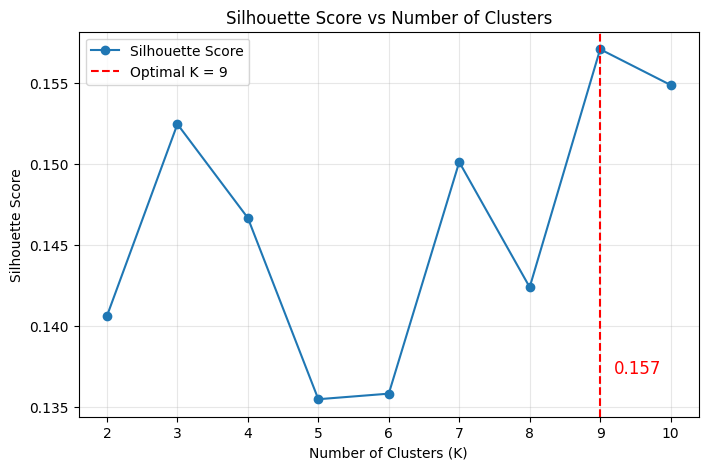

In [200]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import numpy as np

# Calculate silhouette scores (you already have this)
sil_scores = []

K_range = range(2, 11)
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_pca_sample)
    score = silhouette_score(X_pca_sample, labels)
    sil_scores.append(score)

# Find optimal K (max silhouette score)
optimal_k = K_range[np.argmax(sil_scores)]
optimal_score = max(sil_scores)

# Plot
plt.figure(figsize=(8, 5))
plt.plot(K_range, sil_scores, marker='o', label='Silhouette Score')

# Add dotted vertical line for optimal K
plt.axvline(optimal_k, linestyle='--', color='red', label=f'Optimal K = {optimal_k}')

# Annotate the silhouette score at optimal K
plt.text(optimal_k + 0.2, optimal_score - 0.02, f"{optimal_score:.3f}", color='red', fontsize=12)

plt.xlabel("Number of Clusters (K)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Score vs Number of Clusters")
plt.grid(alpha=0.3)
plt.legend()
plt.show()


In [201]:
kmeans_final = KMeans(
    n_clusters=optimal_k,
    random_state=42,
    n_init=30
)

clusters = kmeans_final.fit_predict(X_pca)

df_bin['Cluster'] = clusters


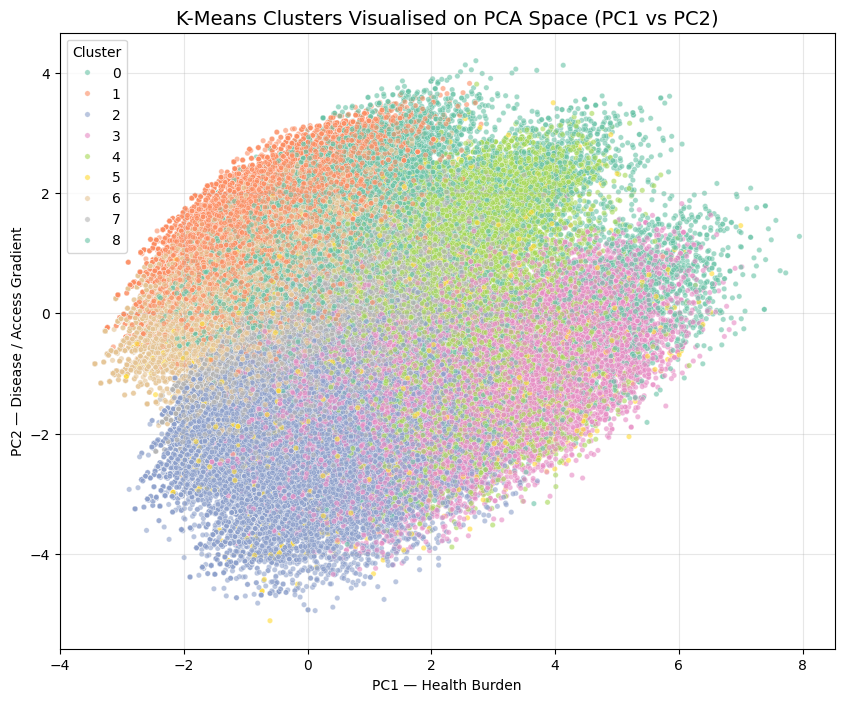

In [202]:
import seaborn as sns

plt.figure(figsize=(10, 8))
sns.scatterplot(
    x=X_pca[:, 0],
    y=X_pca[:, 1],
    hue=df_bin['Cluster'],
    palette='Set2',
    alpha=0.6,
    s=15
)

plt.title("K-Means Clusters Visualised on PCA Space (PC1 vs PC2)", fontsize=14)
plt.xlabel("PC1 — Health Burden")
plt.ylabel("PC2 — Disease / Access Gradient")
plt.legend(title="Cluster")
plt.grid(alpha=0.3)
plt.show()


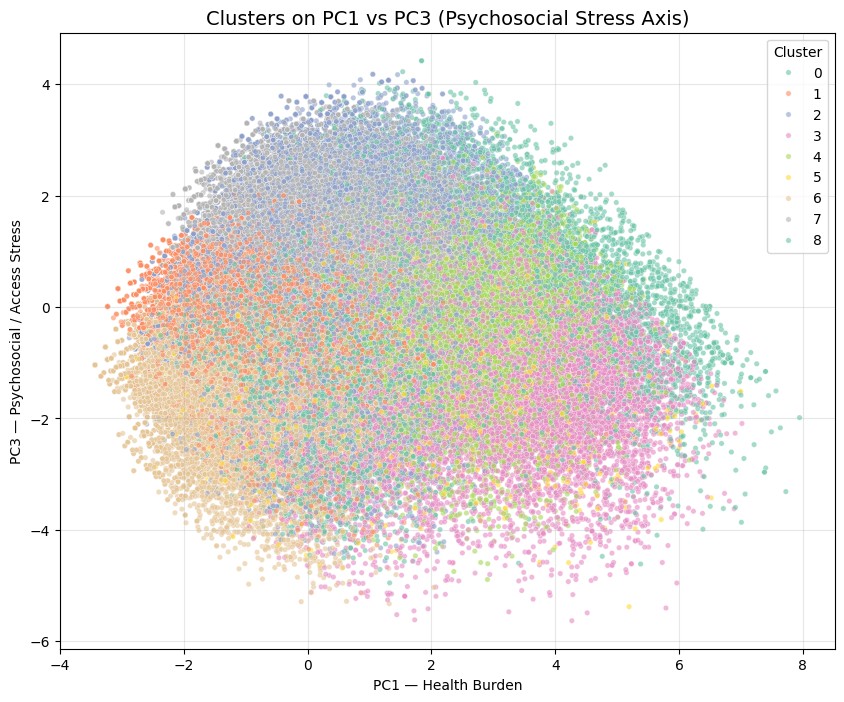

In [203]:
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x=X_pca[:, 0],
    y=X_pca[:, 2],
    hue=df_bin['Cluster'],
    palette='Set2',
    alpha=0.6,
    s=15
)

plt.title("Clusters on PC1 vs PC3 (Psychosocial Stress Axis)", fontsize=14)
plt.xlabel("PC1 — Health Burden")
plt.ylabel("PC3 — Psychosocial / Access Stress")
plt.grid(alpha=0.3)
plt.show()


In [204]:
profile_features = [
    'GenHlth_ord', 'PhysHlth_Cat_PhysHlth_Frequent',
    'MentHlth_Cat_MentHlth_Frequent',
    'HighBP', 'HighChol', 'HeartDiseaseorAttack',
    'Stroke', 'BMI_Cat_Obese', 'Smoker',
    'NoDocbcCost', 'PhysActivity',
    'Education_ord', 'Income_ord', 'Age_ord'
]

cluster_profile = (
    df_bin
    .groupby('Cluster')[profile_features]
    .mean()
)

cluster_profile['Count'] = df_bin['Cluster'].value_counts()

cluster_profile.round(2)


,GenHlth_ord,PhysHlth_Cat_PhysHlth_Frequent,MentHlth_Cat_MentHlth_Frequent,HighBP,HighChol,HeartDiseaseorAttack,Stroke,BMI_Cat_Obese,Smoker,NoDocbcCost,PhysActivity,Education_ord,Income_ord,Age_ord,Count
Cluster,,,,,,,,,,,,,,,
0,2.47,0.00,0.00,0.54,0.45,0.08,0.00,1.00,0.43,0.06,0.71,4.91,6.13,2.26,28396
1,2.22,0.01,0.00,0.44,0.44,0.08,0.00,0.00,0.46,0.05,0.77,4.97,6.20,2.34,38244
2,2.41,0.02,0.00,0.36,0.40,0.05,0.00,0.29,0.41,0.10,0.81,5.19,6.26,2.06,44109
3,3.39,0.44,1.00,0.50,0.51,0.13,0.00,0.41,0.58,0.23,0.60,4.75,4.85,2.10,21730
4,3.76,0.99,0.00,0.64,0.56,0.21,0.00,0.42,0.56,0.14,0.53,4.68,4.95,2.46,18414
5,2.72,0.22,0.14,0.30,0.30,0.11,0.07,0.00,0.52,0.11,0.71,4.93,5.28,2.26,3053
6,2.04,0.01,0.01,0.32,0.34,0.06,0.00,0.00,0.45,0.05,0.81,5.06,6.12,2.33,33976
7,2.56,0.00,0.00,0.46,0.45,0.09,0.00,0.32,0.43,0.07,0.76,5.11,6.21,2.30,31867
8,3.43,0.35,0.19,0.75,0.65,0.39,1.00,0.34,0.59,0.13,0.61,4.68,4.77,2.59,9992


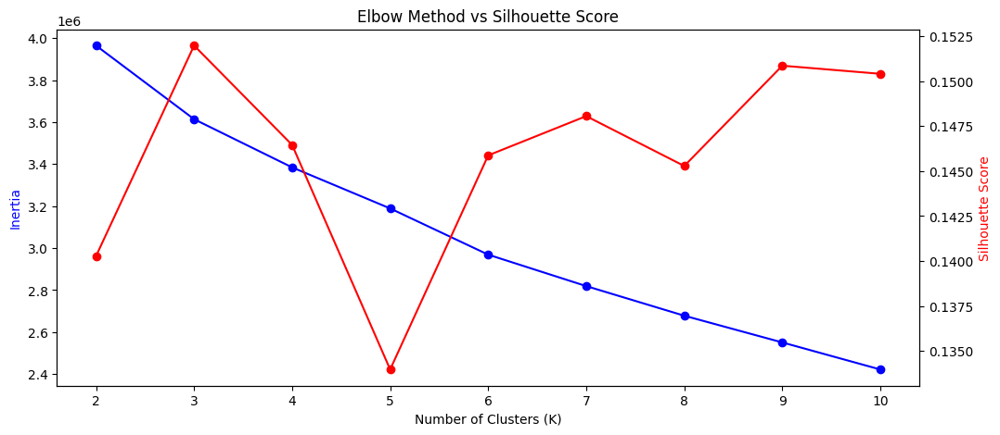

In [222]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

# We use the PCA data for speed and better feature separation
K_range = range(2, 11)
inertia = []
sig_scores = []

# Take a sample if the dataset is too large (e.g., 50,000 rows) for faster silhouette calculation
X_sample = X_pca[np.random.choice(X_pca.shape[0], 50000, replace=False)]

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=50)
    labels = kmeans.fit_predict(X_pca)
    
    inertia.append(kmeans.inertia_)
    # Silhouette is computationally expensive, hence the sample
    sig_scores.append(silhouette_score(X_sample, kmeans.fit_predict(X_sample)))

# Plotting the Results
fig, ax1 = plt.subplots(figsize=(12, 5))

# Elbow Plot (Inertia)
ax1.plot(K_range, inertia, 'bo-', label='Inertia (Elbow)')
ax1.set_xlabel('Number of Clusters (K)')
ax1.set_ylabel('Inertia', color='b')

# Silhouette Plot
ax2 = ax1.twinx()
ax2.plot(K_range, sig_scores, 'ro-', label='Silhouette Score')
ax2.set_ylabel('Silhouette Score', color='r')

plt.title('Elbow Method vs Silhouette Score')
plt.show()

In [223]:
# Re-run K-means with the optimal K
final_kmeans = KMeans(n_clusters=3, random_state=42, n_init=50)
df_fe['Final_Cluster'] = final_kmeans.fit_predict(X_pca)

# Calculate the new silhouette score
from sklearn.metrics import silhouette_score
# Using a sample for speed
sample_idx = np.random.choice(len(X_pca), 10000, replace=False)
new_score = silhouette_score(X_pca[sample_idx], df_fe['Final_Cluster'].iloc[sample_idx])

print(f"New Silhouette Score for K=3: {new_score:.4f}")

New Silhouette Score for K=3: 0.1526


In [224]:
# Cross-tabulate clusters with Diabetes labels
analysis = pd.crosstab(df_fe['Final_Cluster'], df_fe['Diabetes_012'], normalize='index') * 100
print("Diabetes Distribution per Cluster (%):")
print(analysis.round(2))

Diabetes Distribution per Cluster (%):
Diabetes_012     0.0   1.0    2.0
Final_Cluster                    
0              67.60  2.96  29.43
1              86.60  1.76  11.65
2              82.99  2.03  14.98


AttributeError: 'Text' object has no property 'markerfacecolor'

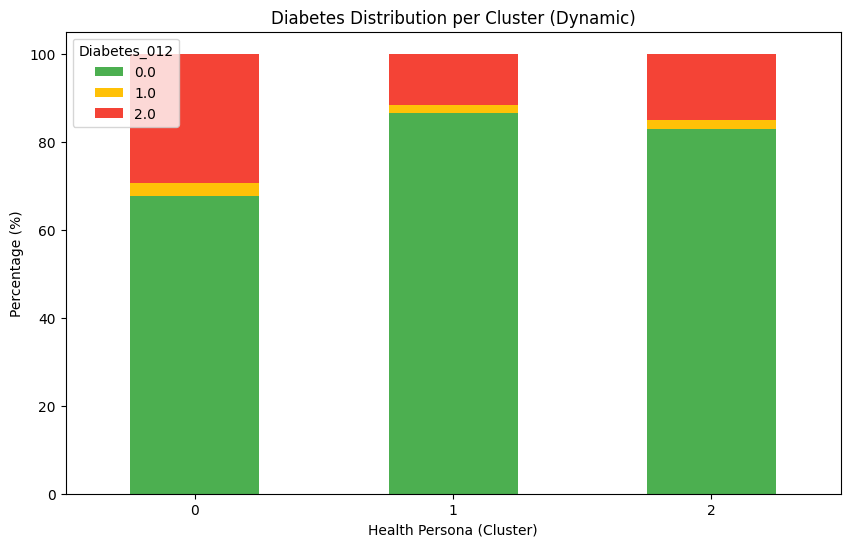

In [233]:
import matplotlib.pyplot as plt

# 1. Use the 'analysis' crosstab you already created
# We sort it to ensure the clusters appear in order (0, 1, 2)
ax = analysis.plot(kind='bar', 
                   stacked=True, 
                   figsize=(10, 6), 
                   color=['#4CAF50', '#FFC107', '#F44336'])

# 2. Add labels and title
plt.title('Diabetes Distribution per Cluster (Dynamic)')
plt.xlabel('Health Persona (Cluster)')
plt.ylabel('Percentage (%)')
plt.xticks(rotation=0) # Keeps cluster names horizontal

# 3. Dynamically add percentage labels inside the bars
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    if height > 2: # Only show label if the segment is large enough
        ax.text(x + width/2, 
                y + height/2, 
                f'{height:.1f}%', 
                markerfacecolor='white',
                ha='center', 
                va='center',
                fontweight='bold')

# 4. Move legend so it doesn't block the data
plt.legend(title='Diabetes Status', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [225]:
import plotly.graph_objects as go

# 1. Prepare data for the radar chart
# We'll use the mean of scaled features to see the relative "shape"
features_to_plot = ['BMI', 'Age', 'Income', 'health_burden', 'HighBP', 'Smoker']
plot_data = df_fe.groupby('Final_Cluster')[features_to_plot].mean()

# Normalize data to a 0-1 scale for the chart
plot_data_norm = (plot_data - plot_data.min()) / (plot_data.max() - plot_data.min())

fig = go.Figure()

for i in range(3):
    fig.add_trace(go.Scatterpolar(
        r=plot_data_norm.iloc[i].values,
        theta=features_to_plot,
        fill='toself',
        name=f'Cluster {i} (Diabetes Risk: {analysis.iloc[i, 2]:.1f}%)'
    ))

fig.update_layout(
    polar=dict(radialaxis=dict(visible=True, range=[0, 1])),
    showlegend=True,
    title="Comparison of Health Personas"
)

fig.show()

In [226]:
from sklearn.cluster import DBSCAN

# Using the first 2 or 3 PCA components is much faster
dbscan = DBSCAN(eps=0.5, min_samples=50) 
db_clusters = dbscan.fit_predict(X_pca[:, :3])

df_final_rules['DBSCAN_Cluster'] = db_clusters

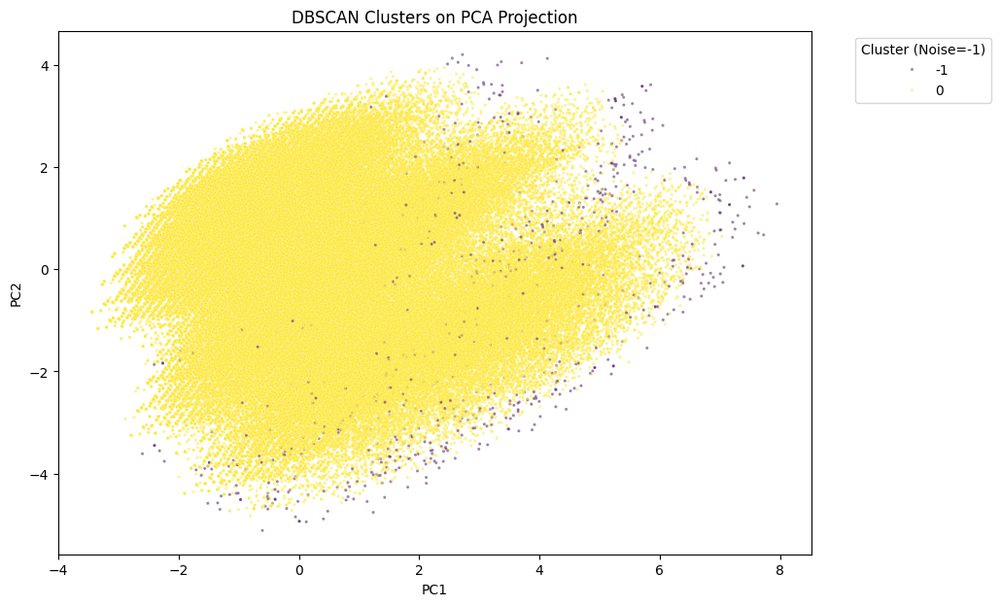

In [227]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 7))

# Plot noise points separately in gray, then clusters in color
sns.scatterplot(
    x=X_pca[:, 0], 
    y=X_pca[:, 1], 
    hue=df_final_rules['DBSCAN_Cluster'], 
    palette='viridis', 
    alpha=0.5, 
    s=5
)

plt.title('DBSCAN Clusters on PCA Projection')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend(title='Cluster (Noise=-1)', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

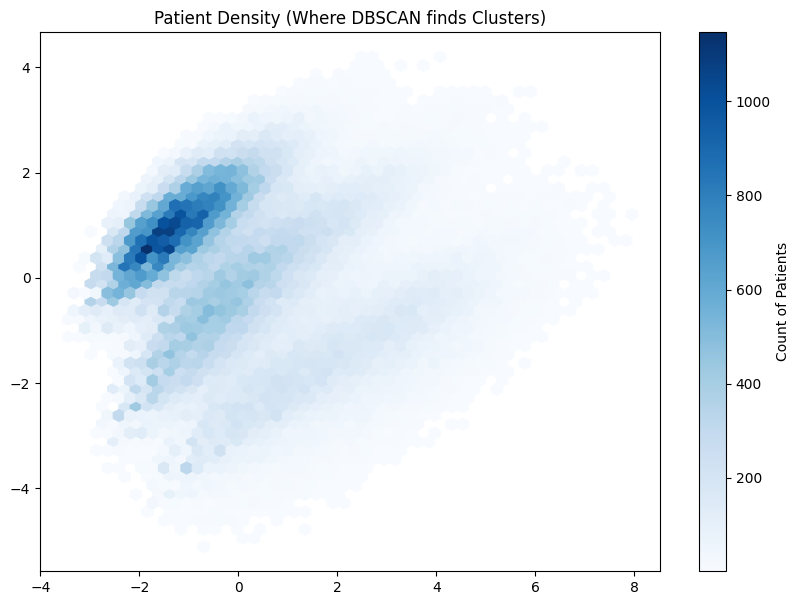

In [228]:
plt.figure(figsize=(10, 7))
plt.hexbin(X_pca[:, 0], X_pca[:, 1], gridsize=50, cmap='Blues', mincnt=1)
plt.colorbar(label='Count of Patients')
plt.title('Patient Density (Where DBSCAN finds Clusters)')
plt.show()

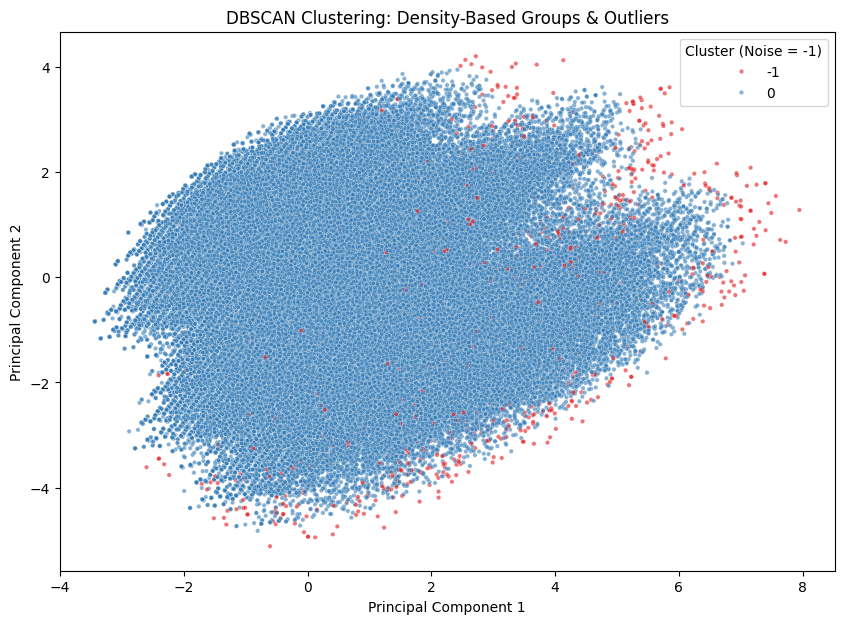

In [229]:
# Assuming 'db_clusters' contains your DBSCAN results
plt.figure(figsize=(10, 7))

# Plot noise (-1) in a light gray to distinguish from actual clusters
sns.scatterplot(
    x=X_pca[:, 0], 
    y=X_pca[:, 1], 
    hue=df_final_rules['DBSCAN_Cluster'], 
    palette='Set1', 
    alpha=0.6, 
    s=10
)

plt.title('DBSCAN Clustering: Density-Based Groups & Outliers')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster (Noise = -1)')
plt.show()

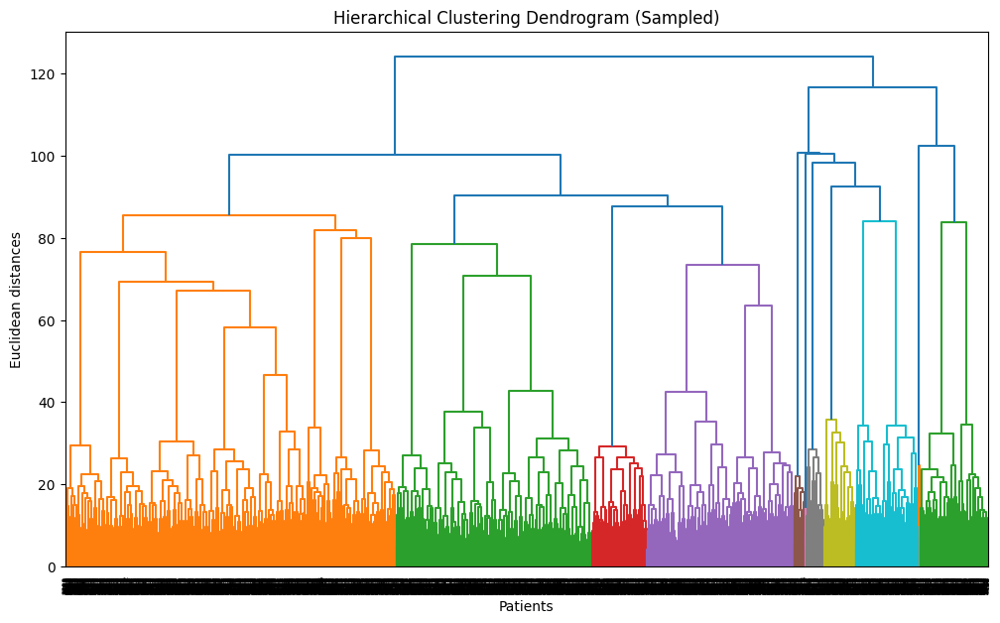

In [230]:
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering

# Sampling for memory efficiency
df_sample = df_final_rules.sample(5000, random_state=42)
scaler = StandardScaler()
sample_scaled = scaler.fit_transform(df_sample)

# Generate Dendrogram
plt.figure(figsize=(12, 7))
dendrogram = sch.dendrogram(sch.linkage(sample_scaled, method='ward'))
plt.title('Hierarchical Clustering Dendrogram (Sampled)')
plt.xlabel('Patients')
plt.ylabel('Euclidean distances')
plt.show()